In [50]:
import pandas as pd

In [51]:
meta_data = pd.read_csv('../../../For_analysis/RNASequencing/IR3/metaDataIR3.csv')
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [52]:
meta_data.columns

Index(['HudAlphaID', 'QCflagIR3', 'Specimen Bar Code', 'PATNO', 'GENDER',
       'DIAGNOSIS', 'CLINICAL_EVENT', 'Specimen Bar Code.1', 'Quantity (ug)',
       'Concentration (ng/ul)', 'Concentration Flag', 'Submitted Volume (ul)',
       'Normalization Volume (30ng/ul)', 'Total Volume (ul)',
       'Input RNASeq (ng)', 'Input miRNA (ng)', '260/280 Ratio',
       '260/230 Ratio', 'RIN Value', 'BOX', 'POSITION', 'Plate', 'Sample',
       'deletion_length', 'insertion_length', 'mismatch_rate',
       'multimapped_percent', 'uniquely_mapped_percent',
       'num_annotated_splices', 'insertion_rate', 'unmapped_other_percent',
       'multimapped', 'num_splices', 'avg_input_read_length',
       'multimapped_toomany', 'total_reads', 'num_GCAG_splices',
       'unmapped_tooshort', 'unmapped_other', 'unmapped_mismatches_percent',
       'num_noncanonical_splices', 'num_ATAC_splices',
       'multimapped_toomany_percent', 'avg_mapped_read_length',
       'unmapped_mismatches', 'deletion_rate', '

In [53]:
meta_data.PATNO.value_counts()

PATNO
1010     53
1009     53
4104      5
3229      5
3214      5
         ..
42349     1
42298     1
42305     1
42431     1
42312     1
Name: count, Length: 1603, dtype: int64

In [54]:
disease_df = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [55]:
disease_df.DIAGNOSIS.value_counts()

DIAGNOSIS
Genetic Registry    435
PD                  425
Genetic Cohort      418
Control             196
Prodromal            64
SWEDD                63
PDPOOL                1
HCPOOL                1
Name: count, dtype: int64

In [56]:
import os

In [57]:
l = 0
for i in os.listdir('../../../For_analysis/RNASequencing/IR3/quant/'):
    l = l + 1
    print(i)
    if l==3:
        break

PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase2-IR3.3481.BL.0003119333.5104-SL-0197.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase1-IR3.18567.BL.0000302585.5104-SL-1516.longRNA-NEBKAP.salmon.genes.sf


In [58]:
gene_excel = pd.ExcelFile('/12tb_dsk3/For_analysis/Modified Master DNA Repair List HN NPM.xlsx')
df2 = pd.read_excel(gene_excel, 'smaller')
df1 = pd.read_excel(gene_excel, 'Integrated stress response')

In [59]:
gene_list = df2.iloc[:,1].tolist()

In [60]:
import numpy as np
for i in range(100):
    try:
        gene_list.remove(np.nan) # run 4 times
    except:
        break

In [61]:
gene_list = [i.strip() for i in gene_list]

In [62]:
gene_list

['BLM',
 'DCLRE1A',
 'MCMDC2',
 'POLD1',
 'POLD2',
 'POLD3',
 'POLD4',
 'RNF8',
 'APEX1',
 'APEX2',
 'APLF',
 'APTX',
 'ERCC5',
 'FEN1',
 'HPF1',
 'LIG1',
 'LIG3',
 'MBD4',
 'MPG',
 'MUTYH',
 'NEIL1',
 'NEIL2',
 'NEIL3',
 'NTHL1',
 'OGG1',
 'PARP1',
 'PARP2',
 'PNKP',
 'POLB',
 'POLL',
 'POLQ',
 'RAD1',
 'RAD9A',
 'SMUG1',
 'TDG',
 'UNG',
 'XRCC1',
 'APLF',
 'H2AX',
 'DCLRE1C',
 'DTXL3',
 'ERCC1',
 'LIG4',
 'MAD2L2',
 'MRE11',
 'NHEJ1',
 'PARP2',
 'PARP3',
 'PARP9',
 'PNKP',
 'POLA1',
 'POLL',
 'POLM',
 'PRKDC',
 'RAD50',
 'RFC4',
 'RIF1',
 'RNF168',
 'RNF8',
 'SHLD1',
 'SHLD2',
 'SHLD3',
 'TDP1',
 'TP53BP1',
 'XRCC4',
 'XRCC5',
 'XRCC6',
 'CETN2',
 'DDB1',
 'DDB2',
 'ERCC1',
 'ERCC2',
 'ERCC3',
 'ERCC4',
 'ERCC5',
 'ERCC6',
 'ERCC8',
 'GTF2H1',
 'GTF2H2',
 'GTF2H3',
 'GTF2H4',
 'GTF2H5',
 'MMS19',
 'POLD1',
 'POLD2',
 'POLD3',
 'POLE',
 'POLE2',
 'POLE3',
 'POLE4',
 'POLK',
 'RAD23A',
 'RAD23B',
 'RBX1',
 'SLX4',
 'UVSSA',
 'XAB2',
 'XPA',
 'XPC',
 'FAAP20',
 'MAD2L2',
 'REV3L',
 'POL

In [63]:
gene_list = set(gene_list)

In [64]:
len(gene_list )

96

In [65]:

from pybiomart import Server

# Connect to the Ensembl server
server = Server(host='http://www.ensembl.org')
dataset = server.marts['ENSEMBL_MART_ENSEMBL'].datasets['hsapiens_gene_ensembl']  # Replace with your organism

# Query for gene names and Ensembl IDs
# Replace 'BRCA1' with your gene of interest or a list of genes
genes_of_interest = gene_list
query_results = dataset.query(attributes=['external_gene_name', 'ensembl_gene_id'])

# Filter results for your genes of interest
results = query_results[query_results['Gene name'].isin(genes_of_interest)]
print(results)


      Gene name   Gene stable ID
2232     GTF2H1  ENSG00000288114
2238      SHLD1  ENSG00000171984
2974      ERCC5  ENSG00000134899
3129       LIG4  ENSG00000174405
4837       APTX  ENSG00000137074
...         ...              ...
76354     POLE4  ENSG00000115350
81706       XPC  ENSG00000154767
82903    FAAP20  ENSG00000162585
83467     MUTYH  ENSG00000132781
83713    MAD2L2  ENSG00000116670

[107 rows x 2 columns]


In [66]:
set(gene_list) - set(results['Gene name'].tolist())

{'DTXL3'}

In [67]:
keep_genes = results['Gene stable ID'].tolist()

In [68]:
keep_genes.append('ENSG00000163840')

In [69]:
sample_3813 = pd.read_csv('../../../For_analysis/RNASequencing/IR3/quant/PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf' ,sep = '\t')
m = [i.split('.')[0] for i in sample_3813.Name.tolist()]

In [70]:
keep_genes = list(set(m).intersection(keep_genes))

In [71]:
len(keep_genes)

96

In [72]:
l = 0
from tqdm import tqdm
data = pd.DataFrame(columns=keep_genes)
for i in tqdm(os.listdir('../../../For_analysis/RNASequencing/IR3/quant/')):
    if 'genes' not in i:
        continue
    
    read_file_path = '../../../For_analysis/RNASequencing/IR3/quant/'+ str(i)
    df = pd.read_csv(read_file_path ,sep = '\t')
    #print(df.head())
    m = [i.split('.')[0] for i in df.Name.tolist()]
    df['Name'] = m 
    df = df.rename(columns={'TPM': i})
    #print(df.head())
    df = df.set_index('Name')[[i]].T
    
    df = df[keep_genes]
    #print(df.head())
    data = pd.concat([data,df])


  0%|                                                                                                                                         | 0/9513 [00:00<?, ?it/s]/tmp/ipykernel_121368/3419326005.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data = pd.concat([data,df])
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9513/9513 [02:05<00:00, 75.72it/s]


In [73]:
data.sort_index()

,ENSG00000134574,ENSG00000178460,ENSG00000012061,ENSG00000070501,ENSG00000168496,ENSG00000163961,ENSG00000122008,ENSG00000116670,ENSG00000135945,ENSG00000163840,...,ENSG00000123415,ENSG00000100479,ENSG00000169188,ENSG00000109674,ENSG00000140398,ENSG00000020922,ENSG00000005156,ENSG00000110768,ENSG00000136936,ENSG00000169621
PPMI-Phase1-IR3.1009.POOL.0003202425.5104-SL-0095.longRNA-NEBKAP.salmon.genes.sf,13.49440,0.224636,15.60530,44.9458,1.89728,7.63287,16.98980,5.31322,33.8738,21.76560,...,23.22830,3.54462,3.085980,2.05785,4.34593,20.48370,13.99000,22.7095,11.97210,2.91891
PPMI-Phase1-IR3.1009.POOL.0003202427.5104-SL-0287.longRNA-NEBKAP.salmon.genes.sf,4.64597,0.093717,12.38290,27.3852,1.49045,3.81037,11.32090,3.88667,24.4432,12.19470,...,12.19740,2.59771,1.549350,1.79298,2.58527,13.78630,6.38228,16.4249,6.82724,1.94903
PPMI-Phase1-IR3.1009.POOL.0003202429.5104-SL-0479.longRNA-NEBKAP.salmon.genes.sf,4.50514,0.198617,10.77600,37.5009,2.38456,6.16926,13.28100,5.74712,27.1317,15.60500,...,15.57560,3.96168,1.730920,1.93433,2.79138,19.25540,8.07474,17.3952,10.44290,2.51937
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,4.00190,0.176006,14.10150,37.1788,1.90707,5.62901,13.24290,4.81059,26.2133,14.48910,...,16.16810,2.93541,1.769690,1.94135,3.05775,17.83180,7.16691,18.3877,10.00660,2.54169
PPMI-Phase1-IR3.1009.POOL.0003202432.5104-SL-0767.longRNA-NEBKAP.salmon.genes.sf,5.14155,0.299037,11.41410,37.4235,2.14701,6.62103,15.29950,4.80135,28.0017,16.96730,...,15.03010,2.90128,1.025720,1.91128,4.42491,19.24730,8.66727,19.8301,10.48170,2.29065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,2.61208,0.055931,12.05270,28.7197,1.44106,5.04916,11.68610,4.84896,12.3478,10.23520,...,12.91210,1.70509,0.889680,3.06836,2.44723,10.12870,4.84199,14.4807,6.83438,1.34952
PPMI-Phase2-IR3.92490.V04.0001176681.5104-SL-2875.longRNA-NEBKAP.salmon.genes.sf,7.56193,0.204082,15.86420,31.1651,1.48969,6.52728,9.69561,4.49475,19.5633,17.28480,...,11.59110,3.27892,1.995010,3.59681,4.10078,11.93790,8.11669,15.5945,6.30500,2.17777
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,6.33960,0.101232,16.24460,35.1176,1.83635,6.74609,11.92700,6.22637,22.3063,16.17870,...,15.09380,3.03692,1.345550,3.25915,4.63534,13.87330,8.16914,16.8240,6.77291,1.92099
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,3.40269,0.156995,6.32831,32.3301,1.41864,4.42489,11.44270,3.94427,20.2388,11.97360,...,11.83880,3.92107,1.222420,2.52708,1.50860,12.43350,4.28525,15.8973,7.04538,1.99434


In [74]:
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [75]:
l = data.index.tolist()
patient_no = [i.split('.')[1] for i in l]
time_point = [i.split('.')[2] for i in l]

In [76]:
data['Patient_Name'] = patient_no 
data['Time_Point'] = time_point

In [77]:
col_index= ['Patient_Name',
 'Time_Point']+ data.columns.tolist()[0:-2]

In [78]:
data = data[col_index]

In [79]:
data = data.sort_values(by = 'Patient_Name', axis = 0)

In [80]:
data

,Patient_Name,Time_Point,ENSG00000134574,ENSG00000178460,ENSG00000012061,ENSG00000070501,ENSG00000168496,ENSG00000163961,ENSG00000122008,ENSG00000116670,...,ENSG00000123415,ENSG00000100479,ENSG00000169188,ENSG00000109674,ENSG00000140398,ENSG00000020922,ENSG00000005156,ENSG00000110768,ENSG00000136936,ENSG00000169621
PPMI-Phase1-IR3.1009.POOL.0003202438.5104-SL-1343.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,5.56793,0.168492,13.35760,34.61530,2.051640,5.43330,11.98730,4.69996,...,15.98310,3.73374,1.424250,1.993160,2.947880,17.95930,6.91809,18.40560,9.41918,1.911440
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,4.00190,0.176006,14.10150,37.17880,1.907070,5.62901,13.24290,4.81059,...,16.16810,2.93541,1.769690,1.941350,3.057750,17.83180,7.16691,18.38770,10.00660,2.541690
PPMI-Phase2-IR3.1009.POOL.0003203727.5104-SL-4014.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,5.07598,0.174256,13.89700,35.33790,1.938130,6.23206,15.08820,5.19266,...,16.97260,3.26764,2.158370,2.790640,3.635480,20.44200,8.73748,20.63870,12.04950,2.363780
PPMI-Phase2-IR3.1009.POOL.0003202434.5104-SL-0959.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,2.90079,0.100522,5.60053,15.84650,0.803252,2.57956,6.55559,2.48513,...,7.62055,1.90298,0.794906,0.843055,1.542740,8.52249,2.65688,9.12891,4.32330,0.812515
PPMI-Phase1-IR3.1009.POOL.0003202442.5104-SL-1719.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,6.58602,0.335373,12.69450,37.65870,2.184540,5.48816,13.27740,5.42879,...,15.25550,3.70556,1.011080,1.992300,4.033380,20.25460,7.71010,20.18290,9.88404,2.431300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,92490,V06,6.33960,0.101232,16.24460,35.11760,1.836350,6.74609,11.92700,6.22637,...,15.09380,3.03692,1.345550,3.259150,4.635340,13.87330,8.16914,16.82400,6.77291,1.920990
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,92490,V02,2.61208,0.055931,12.05270,28.71970,1.441060,5.04916,11.68610,4.84896,...,12.91210,1.70509,0.889680,3.068360,2.447230,10.12870,4.84199,14.48070,6.83438,1.349520
PPMI-Phase1-IR3.92834.BL.0000286784.5104-SL-0950.longRNA-NEBKAP.salmon.genes.sf,92834,BL,1.56236,0.024155,4.34012,8.72939,0.536892,1.75296,2.74926,1.58355,...,5.96107,1.18466,0.516962,0.670000,0.526451,3.22362,1.81923,4.97560,2.15309,0.699596
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,92834,V02,3.40269,0.156995,6.32831,32.33010,1.418640,4.42489,11.44270,3.94427,...,11.83880,3.92107,1.222420,2.527080,1.508600,12.43350,4.28525,15.89730,7.04538,1.994340


In [81]:
temp_meta = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [82]:
temp_meta.PATNO = temp_meta.PATNO.astype(str)

In [83]:
data = pd.merge(data,temp_meta, left_on = 'Patient_Name', right_on = 'PATNO')

In [84]:
keep_columns = ['DIAGNOSIS'] + data.columns.tolist()[0:-2]

In [85]:
data = data[keep_columns]

In [86]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000134574,ENSG00000178460,ENSG00000012061,ENSG00000070501,ENSG00000168496,ENSG00000163961,ENSG00000122008,...,ENSG00000123415,ENSG00000100479,ENSG00000169188,ENSG00000109674,ENSG00000140398,ENSG00000020922,ENSG00000005156,ENSG00000110768,ENSG00000136936,ENSG00000169621
0,PDPOOL,1009,POOL,5.56793,0.168492,13.35760,34.61530,2.051640,5.43330,11.98730,...,15.98310,3.73374,1.424250,1.993160,2.947880,17.95930,6.91809,18.40560,9.41918,1.911440
1,PDPOOL,1009,POOL,4.00190,0.176006,14.10150,37.17880,1.907070,5.62901,13.24290,...,16.16810,2.93541,1.769690,1.941350,3.057750,17.83180,7.16691,18.38770,10.00660,2.541690
2,PDPOOL,1009,POOL,5.07598,0.174256,13.89700,35.33790,1.938130,6.23206,15.08820,...,16.97260,3.26764,2.158370,2.790640,3.635480,20.44200,8.73748,20.63870,12.04950,2.363780
3,PDPOOL,1009,POOL,2.90079,0.100522,5.60053,15.84650,0.803252,2.57956,6.55559,...,7.62055,1.90298,0.794906,0.843055,1.542740,8.52249,2.65688,9.12891,4.32330,0.812515
4,PDPOOL,1009,POOL,6.58602,0.335373,12.69450,37.65870,2.184540,5.48816,13.27740,...,15.25550,3.70556,1.011080,1.992300,4.033380,20.25460,7.71010,20.18290,9.88404,2.431300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,6.33960,0.101232,16.24460,35.11760,1.836350,6.74609,11.92700,...,15.09380,3.03692,1.345550,3.259150,4.635340,13.87330,8.16914,16.82400,6.77291,1.920990
4740,Prodromal,92490,V02,2.61208,0.055931,12.05270,28.71970,1.441060,5.04916,11.68610,...,12.91210,1.70509,0.889680,3.068360,2.447230,10.12870,4.84199,14.48070,6.83438,1.349520
4741,Prodromal,92834,BL,1.56236,0.024155,4.34012,8.72939,0.536892,1.75296,2.74926,...,5.96107,1.18466,0.516962,0.670000,0.526451,3.22362,1.81923,4.97560,2.15309,0.699596
4742,Prodromal,92834,V02,3.40269,0.156995,6.32831,32.33010,1.418640,4.42489,11.44270,...,11.83880,3.92107,1.222420,2.527080,1.508600,12.43350,4.28525,15.89730,7.04538,1.994340


In [87]:
data = data[data.DIAGNOSIS.isin(['PD','Control','Prodromal'])]

In [88]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000134574,ENSG00000178460,ENSG00000012061,ENSG00000070501,ENSG00000168496,ENSG00000163961,ENSG00000122008,...,ENSG00000123415,ENSG00000100479,ENSG00000169188,ENSG00000109674,ENSG00000140398,ENSG00000020922,ENSG00000005156,ENSG00000110768,ENSG00000136936,ENSG00000169621
106,Prodromal,10874,V06,4.76480,0.107499,12.86840,37.67650,1.960390,6.31838,14.82880,...,15.85670,2.35227,2.092460,1.64843,4.475710,17.63710,7.88183,21.3824,14.29020,2.254970
107,Prodromal,10874,BL,5.01735,0.214337,13.40610,39.30540,3.166270,7.13836,15.88610,...,16.13180,2.72104,0.996124,2.29722,3.905670,17.40120,5.92685,21.0962,12.12930,2.134790
108,Prodromal,10874,V04,7.07232,0.128178,21.92400,42.46450,2.349310,7.19213,13.14260,...,18.73230,3.36163,1.951170,1.05405,4.450270,19.69520,10.36340,22.5367,13.30930,2.396890
109,Prodromal,10874,V02,9.42475,0.335741,19.15040,35.93590,2.327550,6.88978,12.82700,...,19.00820,2.81718,1.981890,1.19561,7.211560,19.66030,10.61860,24.2379,11.31710,3.125140
110,Prodromal,12224,V08,5.41830,0.397237,12.39890,33.40450,3.096920,7.20122,16.65990,...,17.36440,4.15309,1.085440,3.69056,3.876460,21.71430,11.09090,24.5760,15.80240,3.567250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,6.33960,0.101232,16.24460,35.11760,1.836350,6.74609,11.92700,...,15.09380,3.03692,1.345550,3.25915,4.635340,13.87330,8.16914,16.8240,6.77291,1.920990
4740,Prodromal,92490,V02,2.61208,0.055931,12.05270,28.71970,1.441060,5.04916,11.68610,...,12.91210,1.70509,0.889680,3.06836,2.447230,10.12870,4.84199,14.4807,6.83438,1.349520
4741,Prodromal,92834,BL,1.56236,0.024155,4.34012,8.72939,0.536892,1.75296,2.74926,...,5.96107,1.18466,0.516962,0.67000,0.526451,3.22362,1.81923,4.9756,2.15309,0.699596
4742,Prodromal,92834,V02,3.40269,0.156995,6.32831,32.33010,1.418640,4.42489,11.44270,...,11.83880,3.92107,1.222420,2.52708,1.508600,12.43350,4.28525,15.8973,7.04538,1.994340


In [89]:
data.to_csv('/12tb_dsk3/For_analysis/count_matrix_per_gene_list/smaller_response_expression.csv', index=False)

In [90]:
data.columns

Index(['DIAGNOSIS', 'Patient_Name', 'Time_Point', 'ENSG00000134574',
       'ENSG00000178460', 'ENSG00000012061', 'ENSG00000070501',
       'ENSG00000168496', 'ENSG00000163961', 'ENSG00000122008',
       'ENSG00000116670', 'ENSG00000135945', 'ENSG00000163840',
       'ENSG00000062822', 'ENSG00000154767', 'ENSG00000114026',
       'ENSG00000164306', 'ENSG00000152457', 'ENSG00000042088',
       'ENSG00000100823', 'ENSG00000080345', 'ENSG00000167986',
       'ENSG00000138496', 'ENSG00000119318', 'ENSG00000051341',
       'ENSG00000076248', 'ENSG00000225830', 'ENSG00000139372',
       'ENSG00000172613', 'ENSG00000122678', 'ENSG00000113456',
       'ENSG00000129071', 'ENSG00000101868', 'ENSG00000143799',
       'ENSG00000166169', 'ENSG00000253251', 'ENSG00000197299',
       'ENSG00000163918', 'ENSG00000213780', 'ENSG00000049167',
       'ENSG00000101751', 'ENSG00000079246', 'ENSG00000039650',
       'ENSG00000174405', 'ENSG00000129484', 'ENSG00000163161',
       'ENSG00000065057', 'ENSG0000

In [91]:
# comapring control vs all time

In [92]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

In [93]:
Control_sample = data[data.DIAGNOSIS == 'Control']

In [94]:
Control_sample.Time_Point.value_counts()

Time_Point
BL     189
V04    179
V02    177
V06    165
V08    159
Name: count, dtype: int64

In [95]:
PD_sample = data[data.DIAGNOSIS == 'PD']
PD_sample.Time_Point.value_counts()

Time_Point
BL     393
V04    354
V06    352
V08    340
V02    277
Name: count, dtype: int64

In [96]:
Prodromal_sample = data[data.DIAGNOSIS == 'Prodromal']
Prodromal_sample.Time_Point.value_counts()

Time_Point
V04    59
V02    59
V06    58
BL     58
V08    20
Name: count, dtype: int64

In [97]:
Prodromal_sample = Prodromal_sample.reset_index(drop=True)
Prodromal_sample

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000134574,ENSG00000178460,ENSG00000012061,ENSG00000070501,ENSG00000168496,ENSG00000163961,ENSG00000122008,...,ENSG00000123415,ENSG00000100479,ENSG00000169188,ENSG00000109674,ENSG00000140398,ENSG00000020922,ENSG00000005156,ENSG00000110768,ENSG00000136936,ENSG00000169621
0,Prodromal,10874,V06,4.76480,0.107499,12.86840,37.67650,1.960390,6.31838,14.82880,...,15.85670,2.35227,2.092460,1.64843,4.475710,17.63710,7.88183,21.3824,14.29020,2.254970
1,Prodromal,10874,BL,5.01735,0.214337,13.40610,39.30540,3.166270,7.13836,15.88610,...,16.13180,2.72104,0.996124,2.29722,3.905670,17.40120,5.92685,21.0962,12.12930,2.134790
2,Prodromal,10874,V04,7.07232,0.128178,21.92400,42.46450,2.349310,7.19213,13.14260,...,18.73230,3.36163,1.951170,1.05405,4.450270,19.69520,10.36340,22.5367,13.30930,2.396890
3,Prodromal,10874,V02,9.42475,0.335741,19.15040,35.93590,2.327550,6.88978,12.82700,...,19.00820,2.81718,1.981890,1.19561,7.211560,19.66030,10.61860,24.2379,11.31710,3.125140
4,Prodromal,12224,V08,5.41830,0.397237,12.39890,33.40450,3.096920,7.20122,16.65990,...,17.36440,4.15309,1.085440,3.69056,3.876460,21.71430,11.09090,24.5760,15.80240,3.567250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,Prodromal,92490,V06,6.33960,0.101232,16.24460,35.11760,1.836350,6.74609,11.92700,...,15.09380,3.03692,1.345550,3.25915,4.635340,13.87330,8.16914,16.8240,6.77291,1.920990
250,Prodromal,92490,V02,2.61208,0.055931,12.05270,28.71970,1.441060,5.04916,11.68610,...,12.91210,1.70509,0.889680,3.06836,2.447230,10.12870,4.84199,14.4807,6.83438,1.349520
251,Prodromal,92834,BL,1.56236,0.024155,4.34012,8.72939,0.536892,1.75296,2.74926,...,5.96107,1.18466,0.516962,0.67000,0.526451,3.22362,1.81923,4.9756,2.15309,0.699596
252,Prodromal,92834,V02,3.40269,0.156995,6.32831,32.33010,1.418640,4.42489,11.44270,...,11.83880,3.92107,1.222420,2.52708,1.508600,12.43350,4.28525,15.8973,7.04538,1.994340


In [98]:
PD_sample = PD_sample.reset_index(drop=True)
PD_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000134574,ENSG00000178460,ENSG00000012061,ENSG00000070501,ENSG00000168496,ENSG00000163961,ENSG00000122008,...,ENSG00000123415,ENSG00000100479,ENSG00000169188,ENSG00000109674,ENSG00000140398,ENSG00000020922,ENSG00000005156,ENSG00000110768,ENSG00000136936,ENSG00000169621
0,PD,3001,BL,2.33622,0.096275,8.02029,19.0566,1.306060,3.16937,8.97896,...,9.40229,2.213760,0.781092,1.736850,2.171860,10.29680,3.58605,11.47850,6.09350,1.403180
1,PD,3001,V02,6.12406,0.369039,14.33080,36.4777,2.540280,6.85121,19.58090,...,17.77680,2.357690,0.757775,1.953610,3.827620,21.14190,7.93896,23.69730,17.13030,2.945720
2,PD,3001,V06,4.70144,0.237707,10.32090,20.7589,2.209140,4.59770,8.40216,...,10.37630,3.391130,0.984413,0.585764,2.313320,10.22670,5.27480,14.40490,6.21334,1.608010
3,PD,3001,V08,2.60281,0.057456,7.54250,18.4127,0.918066,3.29555,6.25099,...,6.60399,0.874733,1.100090,0.344334,2.050320,8.70592,3.28287,9.06448,4.26570,0.947044
4,PD,3001,V04,4.59722,0.289413,14.47800,34.9155,2.359100,6.28574,14.27040,...,13.78620,2.432370,0.647524,2.043520,4.594970,17.91310,6.64099,23.78750,10.48470,2.008680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,PD,4135,V04,1.28580,0.222148,4.44303,17.0827,1.264520,2.58594,15.43220,...,7.12595,6.099980,0.230917,8.234650,0.514299,10.89140,2.40080,11.02120,5.59567,2.222140
1712,PD,4135,V02,9.19310,0.252454,13.73260,55.2479,2.460760,10.17770,21.04770,...,20.22350,4.132740,2.302110,5.069920,4.519910,21.81140,14.73910,24.95690,12.70250,4.401980
1713,PD,4136,V06,4.25110,0.114722,18.27680,36.9070,2.918550,6.07971,11.25490,...,15.47210,1.780160,1.934970,1.774160,2.372060,15.55030,9.21584,17.27050,9.16871,2.141310
1714,PD,4136,BL,9.54944,0.266181,19.22130,37.7029,2.048540,6.49140,9.87435,...,15.11870,4.134940,1.724370,2.563860,4.358550,12.68470,10.47000,14.75440,6.68002,2.726140


In [99]:
elements = list(set(data.Time_Point))

In [100]:
import itertools

# Define the list


# Generate all combinations of 2 including reverse pairs
combinations_with_reverse = list(itertools.product(elements, repeat=2))

# Print the result
for combo in combinations_with_reverse:
    print(combo)


('V08', 'V08')
('V08', 'BL')
('V08', 'V02')
('V08', 'V04')
('V08', 'V06')
('BL', 'V08')
('BL', 'BL')
('BL', 'V02')
('BL', 'V04')
('BL', 'V06')
('V02', 'V08')
('V02', 'BL')
('V02', 'V02')
('V02', 'V04')
('V02', 'V06')
('V04', 'V08')
('V04', 'BL')
('V04', 'V02')
('V04', 'V04')
('V04', 'V06')
('V06', 'V08')
('V06', 'BL')
('V06', 'V02')
('V06', 'V04')
('V06', 'V06')


In [109]:
PD_sample.Time_Point.value_counts()

Time_Point
BL     393
V04    354
V06    352
V08    340
V02    277
Name: count, dtype: int64

In [110]:
Prodromal_sample.Time_Point.value_counts()

Time_Point
V04    59
V02    59
V06    58
BL     58
V08    20
Name: count, dtype: int64

# A. all combination PRODROMAL vs PD

In [111]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import random
from itertools import product  # assuming combinations_with_reverse is some kind of product

ACCURACY_DICT = dict()
MAX_SAMPLES = dict()
FEATURE_IMPORTANCES = dict()

F1_SCORES = dict()
PRECISION_SCORES = dict()
RECALL_SCORES = dict()
AUC_SCORES = dict()

# Assuming combinations_with_reverse is a list of tuples of time points
# For example, combinations_with_reverse could be:
# combinations_with_reverse = list(product(range(5), repeat=2))  # just as an example

for combo in tqdm(combinations_with_reverse):
    # Filter samples by the time points
    Prodromal_sample_ = Prodromal_sample[Prodromal_sample.Time_Point == combo[0]].iloc[:, 3:].reset_index(drop=True)
    PD_sample_ = PD_sample[PD_sample.Time_Point == combo[1]].iloc[:, 3:].reset_index(drop=True)
    accuracies_temp = []
    auc_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    
    for i in range(1000):
        max_num = min(len(Prodromal_sample_), len(PD_sample_))
        random_numbers = random.sample(range(0, max_num), max_num)

        # Sample randomly
        Prodromal_sample_temp = Prodromal_sample_.iloc[random_numbers, :]
        PD_sample_temp = PD_sample_.iloc[random_numbers, :]
        if i ==0:
            print(len(Prodromal_sample_temp))
            print(len(PD_sample_temp))
        X = pd.concat([Prodromal_sample_temp, PD_sample_temp])
        y = [0] * len(Prodromal_sample_temp) + [1] * len(PD_sample_temp)
        
        # Stratified train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, stratify=y, random_state=42
        )
        
        # Initialize and fit the Logistic Regression model
        model = LogisticRegression(max_iter=5000)
        rfe = RFE(estimator=model, n_features_to_select=96)  # Select top 96 features (adjust as needed)
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)

        selected_features = X.columns[rfe.support_]
        feature_ranks = rfe.ranking_
        model.fit(X_train_rfe, y_train)
        
        # Predict and evaluate the model
        y_pred = model.predict(X_test_rfe)
        y_prob = model.predict_proba(X_test_rfe)[:, 1]  # probability for the positive class
        
        accuracy = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_prob)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        accuracies_temp.append(accuracy)
        auc_scores.append(auc)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)

        # Feature importances (storing for the first iteration or for each iteration if necessary)
        coefficients = model.coef_.flatten()
        feature_coefficients = dict(zip(selected_features, coefficients))
        FEATURE_IMPORTANCES[f'Prodromal_{combo[0]}_PD_{combo[1]}_{i}'] = feature_coefficients
    
    # Calculate the mean scores across all iterations
    ACCURACY_DICT[f'Prodromal_{combo[0]}_PD_{combo[1]}'] = np.mean(accuracies_temp)
    MAX_SAMPLES[f'Prodromal_{combo[0]}_PD_{combo[1]}'] = max_num
    PRECISION_SCORES[f'Prodromal_{combo[0]}_PD_{combo[1]}'] =  np.mean(precision_scores)
    RECALL_SCORES[f'Prodromal_{combo[0]}_PD_{combo[1]}'] =  np.mean(recall_scores)
    AUC_SCORES [f'Prodromal_{combo[0]}_PD_{combo[1]}']=  np.mean(auc_scores)
    
    # Storing additional metrics
    print(f"Metrics for Prodromal_{combo[0]}_PD_{combo[1]}:")
    print(f"Accuracy: {np.mean(accuracies_temp)}")
    print(f"AUC: {np.mean(auc_scores)}")
    print(f"Precision: {np.mean(precision_scores)}")
    print(f"Recall: {np.mean(recall_scores)}")
    print(f"F1 Score: {np.mean(f1_scores)}")


  0%|                                                                                                                                           | 0/25 [00:00<?, ?it/s]

20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/m

Metrics for Prodromal_V08_PD_V08:
Accuracy: 0.644625
AUC: 0.715875
Precision: 0.6577809523809524
Recall: 0.66625
F1 Score: 0.6411388167388168
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  8%|██████████▍                                                                                                                        | 2/25 [00:50<09:30, 24.80s/it]

Metrics for Prodromal_V08_PD_BL:
Accuracy: 0.822375
AUC: 0.89075
Precision: 0.838997619047619
Recall: 0.835
F1 Score: 0.821990836940837
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 12%|███████████████▋                                                                                                                   | 3/25 [01:13<08:53, 24.25s/it]

Metrics for Prodromal_V08_PD_V02:
Accuracy: 0.742
AUC: 0.812
Precision: 0.7468309523809523
Recall: 0.785
F1 Score: 0.7475540404040405
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 16%|████████████████████▉                                                                                                              | 4/25 [01:34<07:56, 22.68s/it]

Metrics for Prodromal_V08_PD_V04:
Accuracy: 0.85
AUC: 0.90575
Precision: 0.865152380952381
Recall: 0.85875
F1 Score: 0.8481015873015874
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 20%|██████████████████████████▏                                                                                                        | 5/25 [01:59<07:52, 23.61s/it]

Metrics for Prodromal_V08_PD_V06:
Accuracy: 0.724125
AUC: 0.767375
Precision: 0.7391785714285714
Recall: 0.7425
F1 Score: 0.7191182539682539
58
58


 24%|███████████████████████████████▍                                                                                                   | 6/25 [02:52<10:39, 33.65s/it]

Metrics for Prodromal_BL_PD_V08:
Accuracy: 0.6252916666666667
AUC: 0.6607222222222222
Precision: 0.6250176705432511
Recall: 0.647
F1 Score: 0.6292490240748327
58
58


 28%|████████████████████████████████████▋                                                                                              | 7/25 [03:46<12:06, 40.38s/it]

Metrics for Prodromal_BL_PD_BL:
Accuracy: 0.5970416666666666
AUC: 0.6330208333333333
Precision: 0.598422202741359
Recall: 0.6084166666666666
F1 Score: 0.5962507099048944
58
58


 32%|█████████████████████████████████████████▉                                                                                         | 8/25 [04:39<12:33, 44.30s/it]

Metrics for Prodromal_BL_PD_V02:
Accuracy: 0.8014166666666667
AUC: 0.8748680555555555
Precision: 0.7997829249869498
Recall: 0.8219166666666667
F1 Score: 0.8041821880058908
58
58


 36%|███████████████████████████████████████████████▏                                                                                   | 9/25 [05:37<12:58, 48.64s/it]

Metrics for Prodromal_BL_PD_V04:
Accuracy: 0.56425
AUC: 0.5937708333333334
Precision: 0.5664903529691842
Recall: 0.5661666666666666
F1 Score: 0.5591408314616925
58
58


 40%|████████████████████████████████████████████████████                                                                              | 10/25 [06:35<12:53, 51.56s/it]

Metrics for Prodromal_BL_PD_V06:
Accuracy: 0.5995416666666668
AUC: 0.6250138888888889
Precision: 0.6011184413539676
Recall: 0.62
F1 Score: 0.6033457271892956
59
59


 44%|█████████████████████████████████████████████████████████▏                                                                        | 11/25 [07:16<11:13, 48.10s/it]

Metrics for Prodromal_V02_PD_V08:
Accuracy: 0.80425
AUC: 0.8790972222222222
Precision: 0.8135881611036022
Recall: 0.8021666666666667
F1 Score: 0.8018818402916713
59
59


 48%|██████████████████████████████████████████████████████████████▍                                                                   | 12/25 [07:54<09:46, 45.14s/it]

Metrics for Prodromal_V02_PD_BL:
Accuracy: 0.8147916666666667
AUC: 0.9014166666666666
Precision: 0.8205529840257781
Recall: 0.8200833333333333
F1 Score: 0.8145008305719792
59
59


 52%|███████████████████████████████████████████████████████████████████▌                                                              | 13/25 [08:45<09:22, 46.88s/it]

Metrics for Prodromal_V02_PD_V02:
Accuracy: 0.7590416666666666
AUC: 0.8235416666666667
Precision: 0.7650180316286741
Recall: 0.7643333333333334
F1 Score: 0.7582358404216775
59
59


 56%|████████████████████████████████████████████████████████████████████████▊                                                         | 14/25 [09:21<08:01, 43.76s/it]

Metrics for Prodromal_V02_PD_V04:
Accuracy: 0.8345833333333333
AUC: 0.91575
Precision: 0.8361592739046301
Recall: 0.8454166666666667
F1 Score: 0.8351076528366548
59
59


 60%|██████████████████████████████████████████████████████████████████████████████                                                    | 15/25 [10:02<07:09, 42.94s/it]

Metrics for Prodromal_V02_PD_V06:
Accuracy: 0.7887083333333332
AUC: 0.8785625
Precision: 0.792781276484953
Recall: 0.79475
F1 Score: 0.7875787210023524
59
59


 64%|███████████████████████████████████████████████████████████████████████████████████▏                                              | 16/25 [10:44<06:23, 42.58s/it]

Metrics for Prodromal_V04_PD_V08:
Accuracy: 0.7988333333333334
AUC: 0.8664722222222222
Precision: 0.798862282802337
Recall: 0.8139166666666667
F1 Score: 0.8005257158881223
59
59


 68%|████████████████████████████████████████████████████████████████████████████████████████▍                                         | 17/25 [11:22<05:29, 41.17s/it]

Metrics for Prodromal_V04_PD_BL:
Accuracy: 0.8472083333333333
AUC: 0.9221111111111111
Precision: 0.8435664279348102
Recall: 0.865
F1 Score: 0.8493047764217512
59
59


 72%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 18/25 [12:15<05:13, 44.75s/it]

Metrics for Prodromal_V04_PD_V02:
Accuracy: 0.7604166666666667
AUC: 0.8191527777777778
Precision: 0.7659587770073064
Recall: 0.7668333333333334
F1 Score: 0.7603487628594134
59
59


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 19/25 [12:55<04:19, 43.25s/it]

Metrics for Prodromal_V04_PD_V04:
Accuracy: 0.8445
AUC: 0.9214375
Precision: 0.8462406095409578
Recall: 0.8558333333333333
F1 Score: 0.8457422956120593
59
59


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 20/25 [13:38<03:36, 43.23s/it]

Metrics for Prodromal_V04_PD_V06:
Accuracy: 0.8074583333333334
AUC: 0.8947638888888888
Precision: 0.8094384858605447
Recall: 0.8175
F1 Score: 0.8077520713027998
58
58


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 21/25 [14:17<02:48, 42.00s/it]

Metrics for Prodromal_V06_PD_V08:
Accuracy: 0.828
AUC: 0.9024583333333334
Precision: 0.8447244502229796
Recall: 0.8146666666666667
F1 Score: 0.8245447137291546
58
58


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 22/25 [14:52<01:59, 39.85s/it]

Metrics for Prodromal_V06_PD_BL:
Accuracy: 0.8785416666666668
AUC: 0.9444375
Precision: 0.8974217803438391
Recall: 0.8629166666666667
F1 Score: 0.8752970158415895
58
58


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 23/25 [15:37<01:22, 41.36s/it]

Metrics for Prodromal_V06_PD_V02:
Accuracy: 0.856375
AUC: 0.9198819444444446
Precision: 0.8584961110784641
Recall: 0.86425
F1 Score: 0.8557986407483943
58
58


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 24/25 [16:12<00:39, 39.61s/it]

Metrics for Prodromal_V06_PD_V04:
Accuracy: 0.8744583333333333
AUC: 0.9522361111111111
Precision: 0.8777820281026164
Recall: 0.8785833333333333
F1 Score: 0.8735458250498053
58
58


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [16:51<00:00, 40.45s/it]

Metrics for Prodromal_V06_PD_V06:
Accuracy: 0.8397083333333333
AUC: 0.9171944444444444
Precision: 0.8448585023636495
Recall: 0.8428333333333332
F1 Score: 0.8391939939624103


In [117]:
ACCURACY_DICT

{'Prodromal_V08_PD_V08': 0.644625,
 'Prodromal_V08_PD_BL': 0.822375,
 'Prodromal_V08_PD_V02': 0.742,
 'Prodromal_V08_PD_V04': 0.85,
 'Prodromal_V08_PD_V06': 0.724125,
 'Prodromal_BL_PD_V08': 0.6252916666666667,
 'Prodromal_BL_PD_BL': 0.5970416666666666,
 'Prodromal_BL_PD_V02': 0.8014166666666667,
 'Prodromal_BL_PD_V04': 0.56425,
 'Prodromal_BL_PD_V06': 0.5995416666666668,
 'Prodromal_V02_PD_V08': 0.80425,
 'Prodromal_V02_PD_BL': 0.8147916666666667,
 'Prodromal_V02_PD_V02': 0.7590416666666666,
 'Prodromal_V02_PD_V04': 0.8345833333333333,
 'Prodromal_V02_PD_V06': 0.7887083333333332,
 'Prodromal_V04_PD_V08': 0.7988333333333334,
 'Prodromal_V04_PD_BL': 0.8472083333333333,
 'Prodromal_V04_PD_V02': 0.7604166666666667,
 'Prodromal_V04_PD_V04': 0.8445,
 'Prodromal_V04_PD_V06': 0.8074583333333334,
 'Prodromal_V06_PD_V08': 0.828,
 'Prodromal_V06_PD_BL': 0.8785416666666668,
 'Prodromal_V06_PD_V02': 0.856375,
 'Prodromal_V06_PD_V04': 0.8744583333333333,
 'Prodromal_V06_PD_V06': 0.8397083333333333}

In [120]:
df_acc = pd.DataFrame(list(ACCURACY_DICT.items()), columns=['Comparison', 'Accuracy'])
df_auc = pd.DataFrame(list(AUC_SCORES.items()), columns=['Comparison', 'AUC'])
#df_f1  = pd.DataFrame(list(F1_SCORES.items()), columns=['Comparison', 'F1'])
df_precision = pd.DataFrame(list(PRECISION_SCORES.items()), columns=['Comparison', 'Precision'])
df_recall = pd.DataFrame(list(RECALL_SCORES.items()), columns=['Comparison', 'Recall'])

In [132]:
df_f1

,Comparison,F1


In [133]:
import pandas as pd
from functools import reduce

# List of DataFrames to merge
dfs = [df_acc, df_auc, df_precision, df_recall]

# Merge all DataFrames on 'Comparison'
df_all = reduce(lambda left, right: pd.merge(left, right, on='Comparison'), dfs)

df_all

,Comparison,Accuracy,AUC,Precision,Recall
0,Prodromal_V08_PD_V08,0.644625,0.715875,0.657781,0.666250
1,Prodromal_V08_PD_BL,0.822375,0.890750,0.838998,0.835000
2,Prodromal_V08_PD_V02,0.742000,0.812000,0.746831,0.785000
3,Prodromal_V08_PD_V04,0.850000,0.905750,0.865152,0.858750
4,Prodromal_V08_PD_V06,0.724125,0.767375,0.739179,0.742500
5,Prodromal_BL_PD_V08,0.625292,0.660722,0.625018,0.647000
6,Prodromal_BL_PD_BL,0.597042,0.633021,0.598422,0.608417
7,Prodromal_BL_PD_V02,0.801417,0.874868,0.799783,0.821917
8,Prodromal_BL_PD_V04,0.564250,0.593771,0.566490,0.566167
9,Prodromal_BL_PD_V06,0.599542,0.625014,0.601118,0.620000


In [139]:
df_all.to_csv('../metrics_csv_files/metrics_smaller_pro_vs_pd.csv',index = False)

In [140]:
PRECISION_SCORES

{'Prodromal_V08_PD_V08': 0.6577809523809524,
 'Prodromal_V08_PD_BL': 0.838997619047619,
 'Prodromal_V08_PD_V02': 0.7468309523809523,
 'Prodromal_V08_PD_V04': 0.865152380952381,
 'Prodromal_V08_PD_V06': 0.7391785714285714,
 'Prodromal_BL_PD_V08': 0.6250176705432511,
 'Prodromal_BL_PD_BL': 0.598422202741359,
 'Prodromal_BL_PD_V02': 0.7997829249869498,
 'Prodromal_BL_PD_V04': 0.5664903529691842,
 'Prodromal_BL_PD_V06': 0.6011184413539676,
 'Prodromal_V02_PD_V08': 0.8135881611036022,
 'Prodromal_V02_PD_BL': 0.8205529840257781,
 'Prodromal_V02_PD_V02': 0.7650180316286741,
 'Prodromal_V02_PD_V04': 0.8361592739046301,
 'Prodromal_V02_PD_V06': 0.792781276484953,
 'Prodromal_V04_PD_V08': 0.798862282802337,
 'Prodromal_V04_PD_BL': 0.8435664279348102,
 'Prodromal_V04_PD_V02': 0.7659587770073064,
 'Prodromal_V04_PD_V04': 0.8462406095409578,
 'Prodromal_V04_PD_V06': 0.8094384858605447,
 'Prodromal_V06_PD_V08': 0.8447244502229796,
 'Prodromal_V06_PD_BL': 0.8974217803438391,
 'Prodromal_V06_PD_V02': 

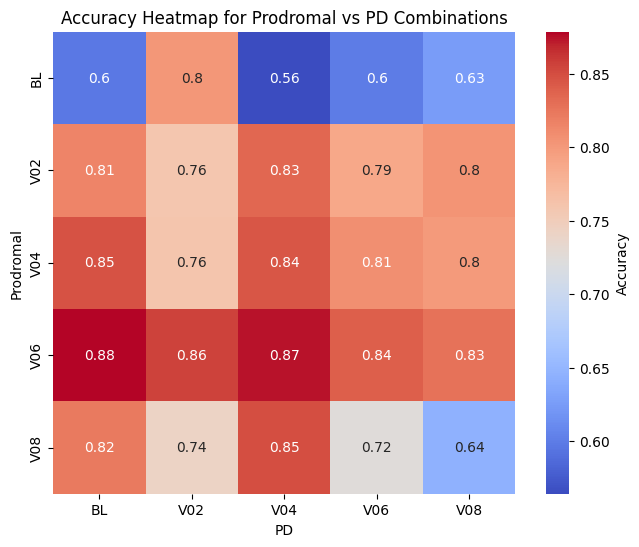

In [141]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
PD= []
acc = []
for i,j in ACCURACY_DICT.items():
    pro.append(i.split('_')[1])
    PD.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pro_PD = pd.DataFrame([PD,pro,acc]).T
accuracy_table_pro_PD  = accuracy_table_pro_PD.rename(columns = {0:'PD', 1:'Prodromal', 2: 'Accuracy'})

accuracy_table_pro_PD['Accuracy'] = accuracy_table_pro_PD['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pro_PD.pivot(index="Prodromal", columns="PD", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for Prodromal vs PD Combinations")
plt.savefig("../heatmaps_plots/accuracy_heatmaps/smaller_pro_vs_pd_accuracy_heatmap.svg", format='svg')

plt.show()
plt.show()

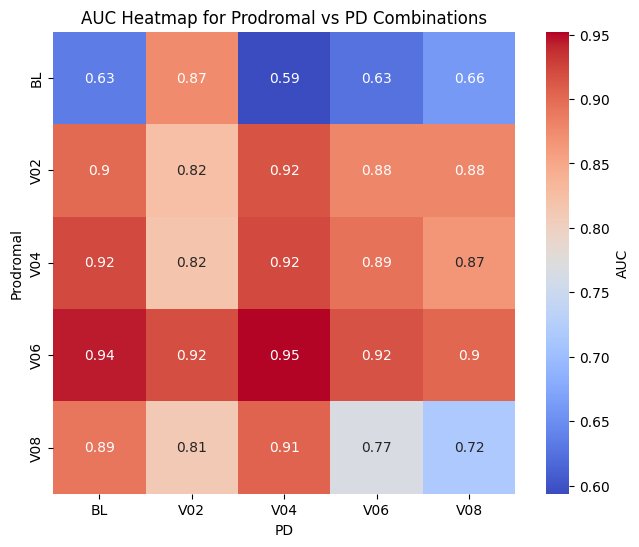

In [142]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
PD= []
auc = []
for i,j in AUC_SCORES.items():
    pro.append(i.split('_')[1])
    PD.append(i.split('_')[-1])
    auc.append(j)


auc_table_pro_PD = pd.DataFrame([PD,pro,auc]).T
auc_table_pro_PD  = auc_table_pro_PD.rename(columns = {0:'PD', 1:'Prodromal', 2: 'AUC'})

auc_table_pro_PD['AUC'] = auc_table_pro_PD['AUC'].astype(float)
heatmap_data_ = auc_table_pro_PD.pivot(index="Prodromal", columns="PD", values="AUC")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'AUC'})
plt.title("AUC Heatmap for Prodromal vs PD Combinations")
plt.savefig("../heatmaps_plots/auc_heatmaps/smaller_pro_vs_pd_auc_heatmap.svg", format='svg')

plt.show()

In [144]:
'''import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import random
import random
ACCURACY_DICT = dict()
MAX_SAMPLES = dict()
FEATURE_IMPORTANCES = dict()


for combo in tqdm(combinations_with_reverse):
    
    Prodromal_sample_ = Prodromal_sample[Prodromal_sample.Time_Point== combo[0]].iloc[:,3:]
    Prodromal_sample_ = Prodromal_sample_.reset_index(drop = True)
    
    PD_sample_ = PD_sample[PD_sample.Time_Point== combo[1]].iloc[:,3:]
    PD_sample_ = PD_sample_.reset_index(drop = True)

    
    accuracies_temp = []
    
    for i in range(1000):
        
        max_num = min(len(Prodromal_sample_),len(PD_sample_))
        
        random_numbers = random.sample(range(0, max_num), max_num)
        
        Prodromal_sample_temp = Prodromal_sample_.iloc[random_numbers,:]
        
        PD_sample_temp = PD_sample_.iloc[random_numbers,:]
        
        X = pd.concat([Prodromal_sample_temp,PD_sample_temp])
        
        y = [0 for i in range(len(Prodromal_sample_temp))] + [1 for i in range(len(PD_sample_temp))]
    
    
    # Stratified train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, stratify=y, random_state=42
        )
        
        # Initialize and fit the Logistic Regression model
        model = LogisticRegression(max_iter=5000)
        rfe = RFE(estimator=model,n_features_to_select=96)  # Select top 10 features, adjust as needed
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)


        selected_features = X.columns[rfe.support_]
        feature_ranks = rfe.ranking_
        model.fit(X_train_rfe, y_train)
        
        # Predict and evaluate the model
        y_pred = model.predict(X_test_rfe)
        accuracy = accuracy_score(y_test, y_pred)
        # Store feature names and scores for the first iteration only, to avoid redundancy
        if i <1000:
            #feature_importance_scores = {feature: rank for feature, rank in zip(X.columns, feature_ranks)}
            selected_features = X.columns[rfe.support_]
            coefficients = model.coef_.flatten()
            feature_coefficients = dict(zip(selected_features, coefficients))
            FEATURE_IMPORTANCES[f'Prodromal_{combo[0]}_PD_{combo[1]}_{i}'] =feature_coefficients
        
        accuracies_temp.append(accuracy )
        

    ACCURACY_DICT[f'Prodromal_{combo[0]}_PD_{combo[1]}'] = np.mean(accuracies_temp)
    MAX_SAMPLES[f'Prodromal_{combo[0]}_PD_{combo[1]}'] = max_num
'''

"import numpy as np\nimport pandas as pd\nfrom sklearn.feature_selection import RFE\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.linear_model import LogisticRegression\nfrom sklearn.metrics import accuracy_score\nimport random\nimport random\nACCURACY_DICT = dict()\nMAX_SAMPLES = dict()\nFEATURE_IMPORTANCES = dict()\n\n\nfor combo in tqdm(combinations_with_reverse):\n    \n    Prodromal_sample_ = Prodromal_sample[Prodromal_sample.Time_Point== combo[0]].iloc[:,3:]\n    Prodromal_sample_ = Prodromal_sample_.reset_index(drop = True)\n    \n    PD_sample_ = PD_sample[PD_sample.Time_Point== combo[1]].iloc[:,3:]\n    PD_sample_ = PD_sample_.reset_index(drop = True)\n\n    \n    accuracies_temp = []\n    \n    for i in range(1000):\n        \n        max_num = min(len(Prodromal_sample_),len(PD_sample_))\n        \n        random_numbers = random.sample(range(0, max_num), max_num)\n        \n        Prodromal_sample_temp = Prodromal_sample_.iloc[random_numbers,:]\n      

In [143]:
'''import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
PD= []
acc = []
for i,j in ACCURACY_DICT.items():
    pro.append(i.split('_')[1])
    PD.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pro_PD = pd.DataFrame([PD,pro,acc]).T
accuracy_table_pro_PD  = accuracy_table_pro_PD.rename(columns = {0:'PD', 1:'Prodromal', 2: 'Accuracy'})

accuracy_table_pro_PD['Accuracy'] = accuracy_table_pro_PD['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pro_PD.pivot(index="Prodromal", columns="PD", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for Prodromal vs PD Combinations")
plt.show()'''

'import pandas as pd\nimport seaborn as sns\nimport matplotlib.pyplot as plt\n\npro = []\nPD= []\nacc = []\nfor i,j in ACCURACY_DICT.items():\n    pro.append(i.split(\'_\')[1])\n    PD.append(i.split(\'_\')[-1])\n    acc.append(j)\n\n\naccuracy_table_pro_PD = pd.DataFrame([PD,pro,acc]).T\naccuracy_table_pro_PD  = accuracy_table_pro_PD.rename(columns = {0:\'PD\', 1:\'Prodromal\', 2: \'Accuracy\'})\n\naccuracy_table_pro_PD[\'Accuracy\'] = accuracy_table_pro_PD[\'Accuracy\'].astype(float)\nheatmap_data_ = accuracy_table_pro_PD.pivot(index="Prodromal", columns="PD", values="Accuracy")\n\n# Plot the heatmap\nplt.figure(figsize=(8, 6))\nsns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={\'label\': \'Accuracy\'})\nplt.title("Accuracy Heatmap for Prodromal vs PD Combinations")\nplt.show()'

In [62]:
accuracy_table_pro_PD

,PD,Prodromal,Accuracy
0,V06,V06,0.837083
1,V04,V06,0.875333
2,V02,V06,0.858708
3,BL,V06,0.885583
4,V08,V06,0.826833
5,V06,V04,0.813083
6,V04,V04,0.839667
7,V02,V04,0.756750
8,BL,V04,0.845292
9,V08,V04,0.800542


In [63]:
heatmap_data_

PD,BL,V02,V04,V06,V08
Prodromal,,,,,
BL,0.602208,0.801500,0.566000,0.601750,0.628000
V02,0.815667,0.755292,0.832167,0.793417,0.806500
V04,0.845292,0.756750,0.839667,0.813083,0.800542
V06,0.885583,0.858708,0.875333,0.837083,0.826833
V08,0.820000,0.738875,0.846500,0.711500,0.645500


In [64]:
heatmap_data_.T

Prodromal,BL,V02,V04,V06,V08
PD,,,,,
BL,0.602208,0.815667,0.845292,0.885583,0.820000
V02,0.801500,0.755292,0.756750,0.858708,0.738875
V04,0.566000,0.832167,0.839667,0.875333,0.846500
V06,0.601750,0.793417,0.813083,0.837083,0.711500
V08,0.628000,0.806500,0.800542,0.826833,0.645500


In [65]:
FEATURE_IMPORTANCES['Prodromal_V08_PD_BL_0']

{'ENSG00000105486': -0.028983250882544654,
 'ENSG00000101868': -0.002431069778249248,
 'ENSG00000188827': -0.024397783161422645,
 'ENSG00000148229': -0.07107047337271438,
 'ENSG00000175482': 0.10400478747830899,
 'ENSG00000009413': 0.13606876171366963,
 'ENSG00000155229': -0.15274492309825774,
 'ENSG00000129484': -0.12613152563149047,
 'ENSG00000111358': 0.03607505939794726,
 'ENSG00000110768': 0.03283152816539122,
 'ENSG00000166169': -0.09022236233819017,
 'ENSG00000253251': 0.02711748404837395,
 'ENSG00000140398': -0.0048031060495824715,
 'ENSG00000163840': 0.09873307990342363,
 'ENSG00000042088': -0.024800393199877837,
 'ENSG00000169188': -0.012966100087940143,
 'ENSG00000065057': 0.07605802447346971,
 'ENSG00000213780': -0.04638700968278985,
 'ENSG00000129071': -0.004575347214683438,
 'ENSG00000134899': 0.031215044786287942,
 'ENSG00000103152': -0.0557382163982776,
 'ENSG00000168496': 0.004817560390198175,
 'ENSG00000167986': -0.24802085091151851,
 'ENSG00000119318': 0.216351520770

In [66]:
FEATURE_IMPORTANCES['Prodromal_V08_PD_BL_0']
sorted_1_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_BL_0'].items(), key=lambda item: item[1]))
sorted_1_dict_FEATURE_IMPORTANCES_asc 

{'ENSG00000100387': -0.4229827451625666,
 'ENSG00000070501': -0.3085164331524699,
 'ENSG00000253729': -0.27134592118275674,
 'ENSG00000167986': -0.24802085091151851,
 'ENSG00000155229': -0.15274492309825774,
 'ENSG00000179262': -0.1403387715457583,
 'ENSG00000154767': -0.13759684078522638,
 'ENSG00000109674': -0.13467074298327106,
 'ENSG00000177084': -0.12839282100170224,
 'ENSG00000129484': -0.12613152563149047,
 'ENSG00000005156': -0.11867801704907734,
 'ENSG00000100823': -0.11319086640760628,
 'ENSG00000163161': -0.11215604822160585,
 'ENSG00000100479': -0.10349336824051389,
 'ENSG00000188486': -0.09819973295565285,
 'ENSG00000134574': -0.09527846454278747,
 'ENSG00000171984': -0.09075157937578153,
 'ENSG00000166169': -0.09022236233819017,
 'ENSG00000187736': -0.08750345686411379,
 'ENSG00000163945': -0.08262873330269334,
 'ENSG00000139372': -0.08133607479321901,
 'ENSG00000039650': -0.07275389421425495,
 'ENSG00000148229': -0.07107047337271438,
 'ENSG00000077514': -0.07040308706112

In [68]:
FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0']
sorted_0_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0'].items(), key=lambda item: item[1]))

In [70]:

FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0']
sorted_0_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0'].items(), key=lambda item: item[1]))


In [71]:
sorted_0_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000139372': -0.33846569597380916,
 'ENSG00000253729': -0.3098549434502969,
 'ENSG00000129071': -0.30505494704950514,
 'ENSG00000148229': -0.30184474977405545,
 'ENSG00000070501': -0.28740115798183374,
 'ENSG00000164306': -0.28328003220798764,
 'ENSG00000100387': -0.24778321210592869,
 'ENSG00000152457': -0.22708264144060872,
 'ENSG00000134899': -0.21082601799769846,
 'ENSG00000145736': -0.20619815280946327,
 'ENSG00000109674': -0.20475962756024116,
 'ENSG00000167986': -0.1577868284057038,
 'ENSG00000113522': -0.15267832612503143,
 'ENSG00000140398': -0.15210277484593235,
 'ENSG00000187736': -0.14499501381332783,
 'ENSG00000020922': -0.13944414616741743,
 'ENSG00000197299': -0.1319693969958266,
 'ENSG00000179262': -0.10659098720939905,
 'ENSG00000116670': -0.10212191788847691,
 'ENSG00000129484': -0.09983271098561593,
 'ENSG00000169621': -0.09814860553275116,
 'ENSG00000143799': -0.09462437842279606,
 'ENSG00000171984': -0.08852144189007088,
 'ENSG00000138496': -0.06691286826456

In [72]:
sorted_1_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0'].items(), key=lambda item: item[1]))
sorted_1_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000139372': -0.33846569597380916,
 'ENSG00000253729': -0.3098549434502969,
 'ENSG00000129071': -0.30505494704950514,
 'ENSG00000148229': -0.30184474977405545,
 'ENSG00000070501': -0.28740115798183374,
 'ENSG00000164306': -0.28328003220798764,
 'ENSG00000100387': -0.24778321210592869,
 'ENSG00000152457': -0.22708264144060872,
 'ENSG00000134899': -0.21082601799769846,
 'ENSG00000145736': -0.20619815280946327,
 'ENSG00000109674': -0.20475962756024116,
 'ENSG00000167986': -0.1577868284057038,
 'ENSG00000113522': -0.15267832612503143,
 'ENSG00000140398': -0.15210277484593235,
 'ENSG00000187736': -0.14499501381332783,
 'ENSG00000020922': -0.13944414616741743,
 'ENSG00000197299': -0.1319693969958266,
 'ENSG00000179262': -0.10659098720939905,
 'ENSG00000116670': -0.10212191788847691,
 'ENSG00000129484': -0.09983271098561593,
 'ENSG00000169621': -0.09814860553275116,
 'ENSG00000143799': -0.09462437842279606,
 'ENSG00000171984': -0.08852144189007088,
 'ENSG00000138496': -0.06691286826456

In [73]:
sorted_2_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0'].items(), key=lambda item: item[1]))
sorted_2_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000139372': -0.33846569597380916,
 'ENSG00000253729': -0.3098549434502969,
 'ENSG00000129071': -0.30505494704950514,
 'ENSG00000148229': -0.30184474977405545,
 'ENSG00000070501': -0.28740115798183374,
 'ENSG00000164306': -0.28328003220798764,
 'ENSG00000100387': -0.24778321210592869,
 'ENSG00000152457': -0.22708264144060872,
 'ENSG00000134899': -0.21082601799769846,
 'ENSG00000145736': -0.20619815280946327,
 'ENSG00000109674': -0.20475962756024116,
 'ENSG00000167986': -0.1577868284057038,
 'ENSG00000113522': -0.15267832612503143,
 'ENSG00000140398': -0.15210277484593235,
 'ENSG00000187736': -0.14499501381332783,
 'ENSG00000020922': -0.13944414616741743,
 'ENSG00000197299': -0.1319693969958266,
 'ENSG00000179262': -0.10659098720939905,
 'ENSG00000116670': -0.10212191788847691,
 'ENSG00000129484': -0.09983271098561593,
 'ENSG00000169621': -0.09814860553275116,
 'ENSG00000143799': -0.09462437842279606,
 'ENSG00000171984': -0.08852144189007088,
 'ENSG00000138496': -0.06691286826456

In [74]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

In [75]:
data['DIAGNOSIS_2'] = data['DIAGNOSIS']

/tmp/ipykernel_189545/3022521848.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DIAGNOSIS_2'] = data['DIAGNOSIS']


In [76]:
data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)


/tmp/ipykernel_189545/1258779229.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)
/tmp/ipykernel_189545/1258779229.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.

In [77]:
data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']

/tmp/ipykernel_189545/3372653969.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
/tmp/ipykernel_189545/3372653969.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']


In [78]:
data = data.sort_values(by = 'New_Time_Point')

In [79]:
tmp_data = data[data.Time_Point !='V02']

In [80]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000105486,ENSG00000101868,ENSG00000188827,ENSG00000148229,ENSG00000175482,ENSG00000009413,ENSG00000155229,...,ENSG00000169621,ENSG00000104884,ENSG00000174405,ENSG00000122678,ENSG00000056050,ENSG00000101751,ENSG00000196419,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,1.816110,3.490520,0.725241,11.09700,41.61760,21.31550,14.87160,...,2.302920,1.184190,3.49413,10.62350,3.56763,20.06580,79.2238,Control,1.Control_BL,Control_BL
1675,1.Control,3555,BL,3.103000,4.262440,0.824482,8.07995,28.14460,22.98820,13.02780,...,2.161510,0.778523,3.74447,9.92937,4.52789,16.66020,53.4657,Control,1.Control_BL,Control_BL
1672,1.Control,3554,BL,3.274510,1.970050,0.689353,7.68742,22.33730,13.58840,11.48290,...,2.312650,0.992975,4.65698,13.06600,4.57225,16.74560,28.4910,Control,1.Control_BL,Control_BL
1663,1.Control,3551,BL,4.087010,7.143140,1.225090,11.55840,32.91650,35.10840,24.31030,...,3.611010,1.926670,5.52086,24.82980,6.54887,41.96610,56.4854,Control,1.Control_BL,Control_BL
1844,1.Control,3614,BL,1.749620,3.049350,0.472816,6.65839,25.93450,18.00110,9.27163,...,1.837820,0.756572,2.82238,10.01780,3.57537,19.97190,28.2523,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,3.PD,3352,V08,0.485638,0.773736,0.143345,3.00090,6.96481,4.92267,3.73836,...,0.456463,0.370031,1.04419,2.56707,1.02202,5.93362,18.2956,PD,3.PD_V08,PD_V08
3260,3.PD,4099,V08,2.090720,3.305080,0.583706,10.47100,33.89200,23.59190,13.97200,...,2.380530,1.033030,4.21143,10.70670,4.21336,21.25880,69.9189,PD,3.PD_V08,PD_V08
578,3.PD,3154,V08,1.873300,3.547230,0.469024,10.78940,26.32260,22.57490,12.89770,...,2.322890,0.977768,3.69830,7.96253,4.67059,15.66870,68.0578,PD,3.PD_V08,PD_V08
1992,3.PD,3700,V08,2.047790,2.747540,0.598427,8.44090,26.04570,17.40850,9.51847,...,2.396510,1.099080,3.56683,9.99846,4.96052,17.79020,37.4609,PD,3.PD_V08,PD_V08


In [81]:
df = pd.DataFrame(sorted_2_dict_FEATURE_IMPORTANCES_asc.items())
df[2] = np.abs(df[1])
df = df.sort_values(by = 2, ascending=False)
df

,0,1,2
95,ENSG00000009413,0.399819,0.399819
94,ENSG00000166169,0.346406,0.346406
0,ENSG00000139372,-0.338466,0.338466
93,ENSG00000122678,0.326152,0.326152
92,ENSG00000012061,0.317823,0.317823
...,...,...,...
44,ENSG00000168496,-0.004005,0.004005
48,ENSG00000067369,0.003893,0.003893
45,ENSG00000136936,-0.001834,0.001834
47,ENSG00000154767,0.001102,0.001102


In [82]:
genes = df[0].values.tolist()

In [83]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return ensembleid

In [84]:
len(genes)

96

In [85]:
len(genes[50:95])

45

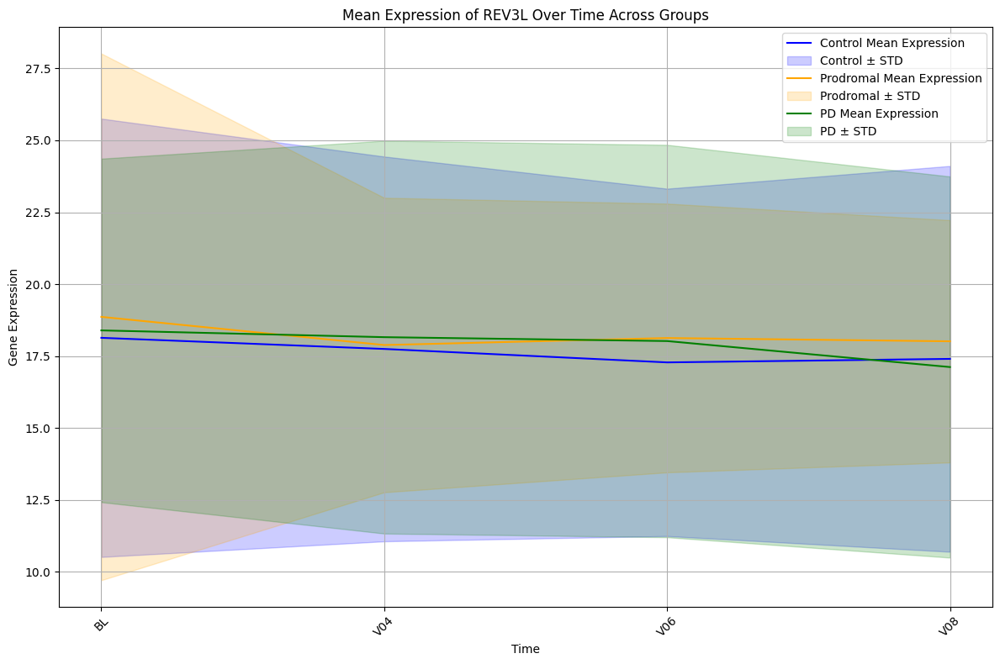

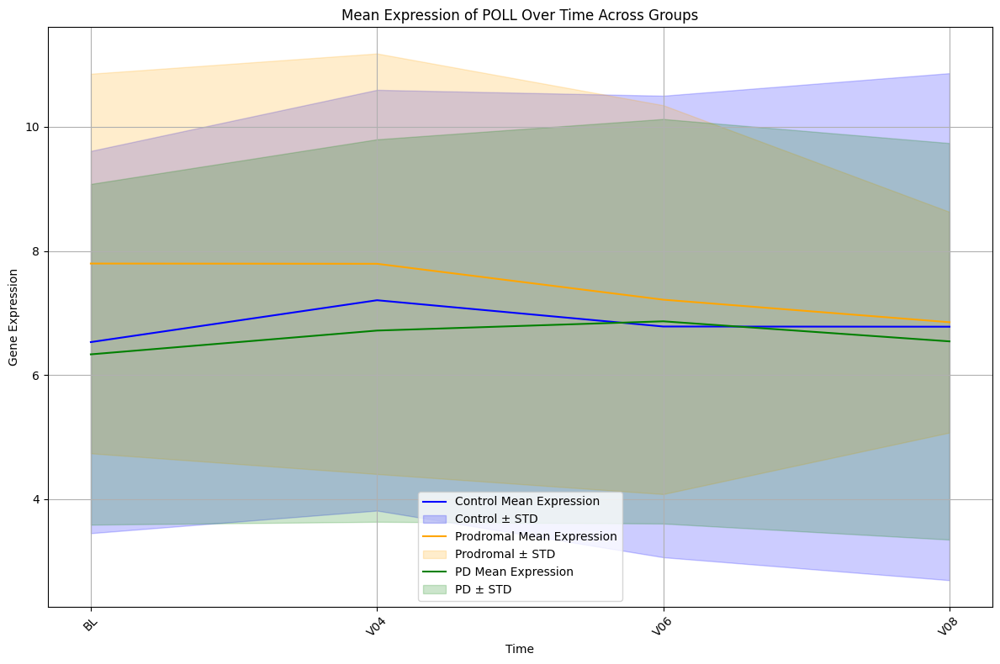

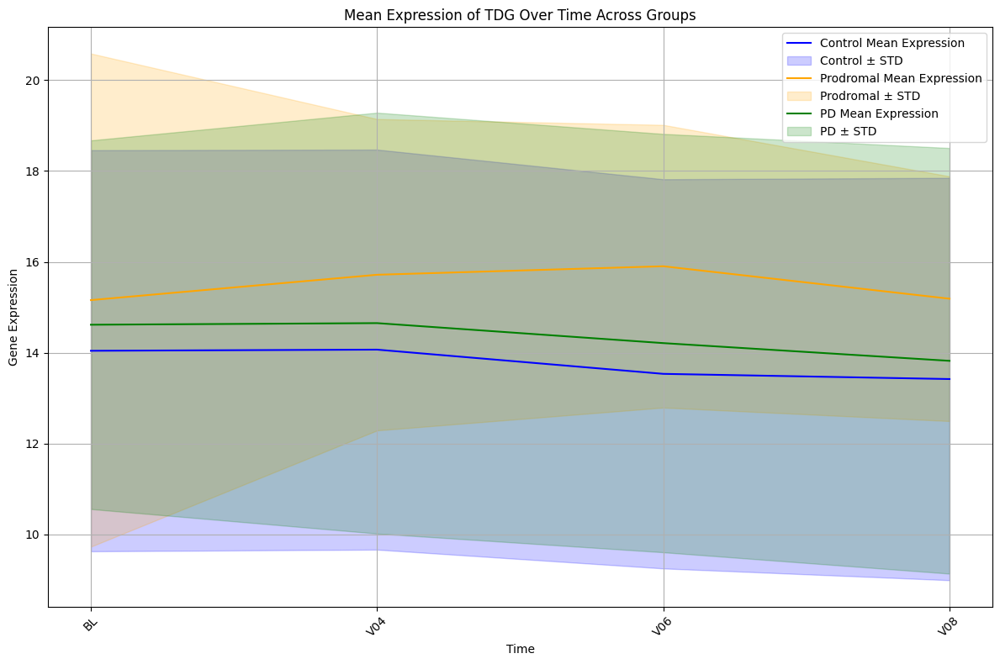

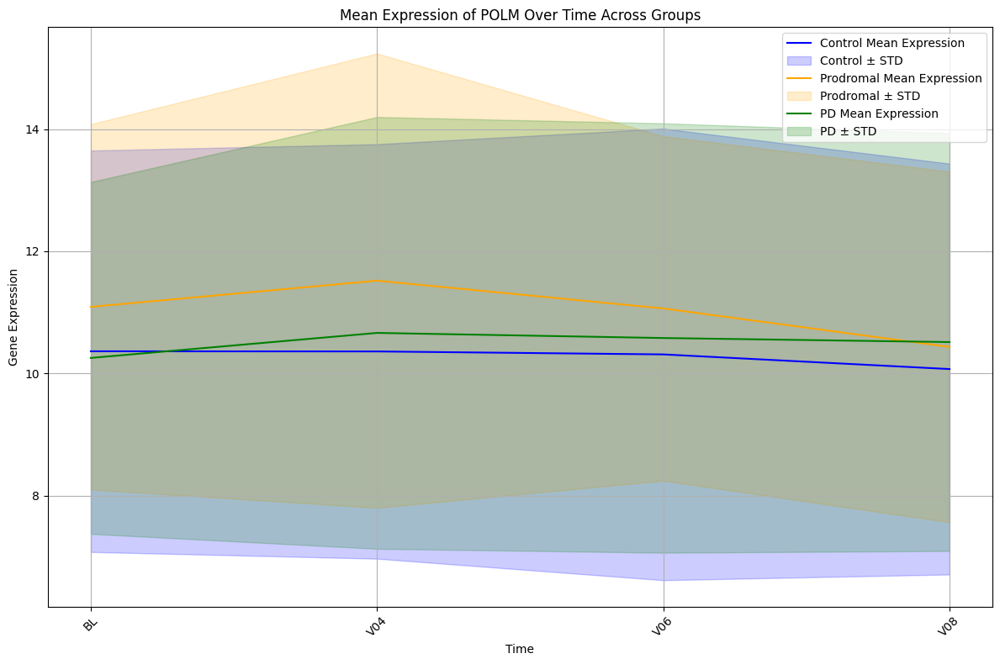

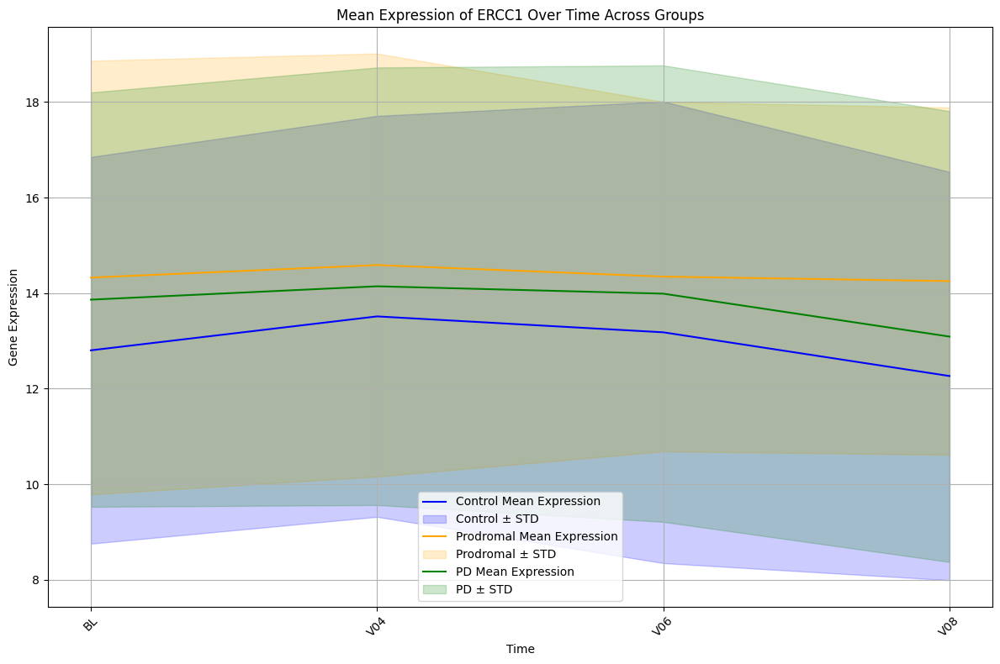

...

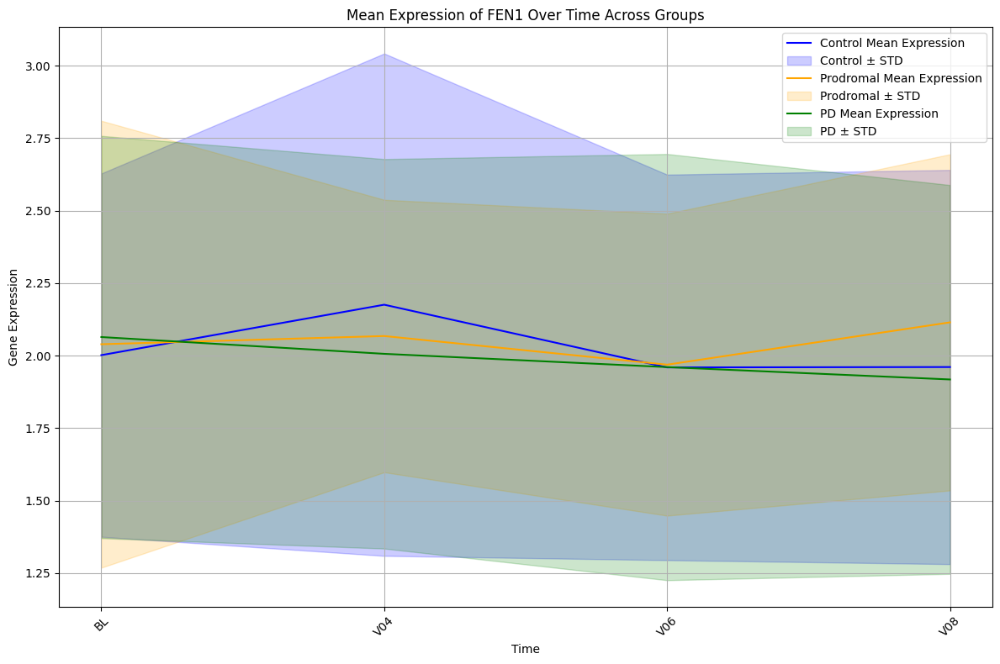

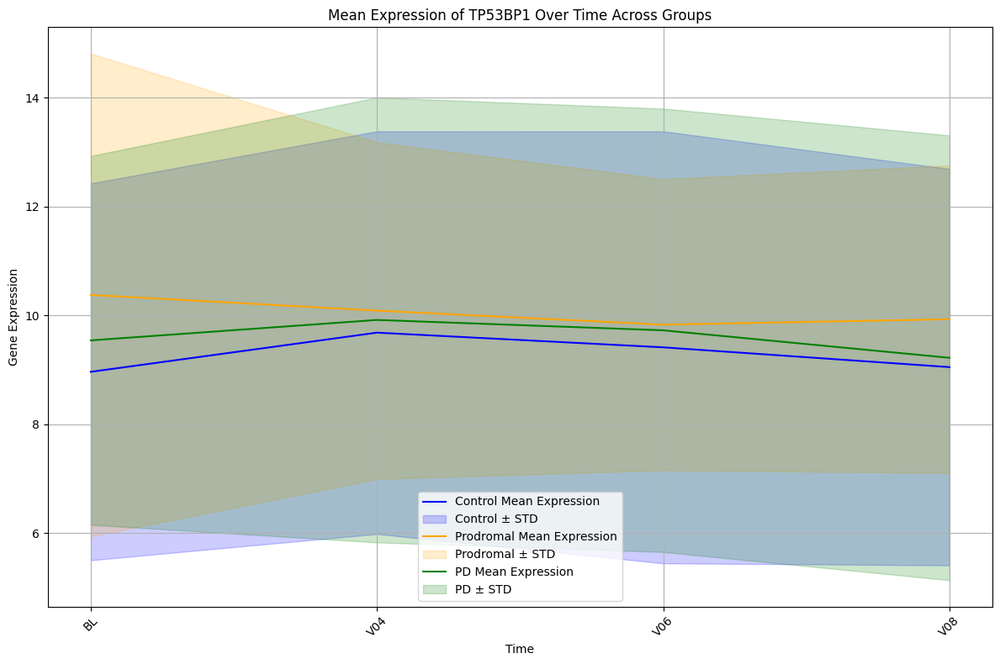

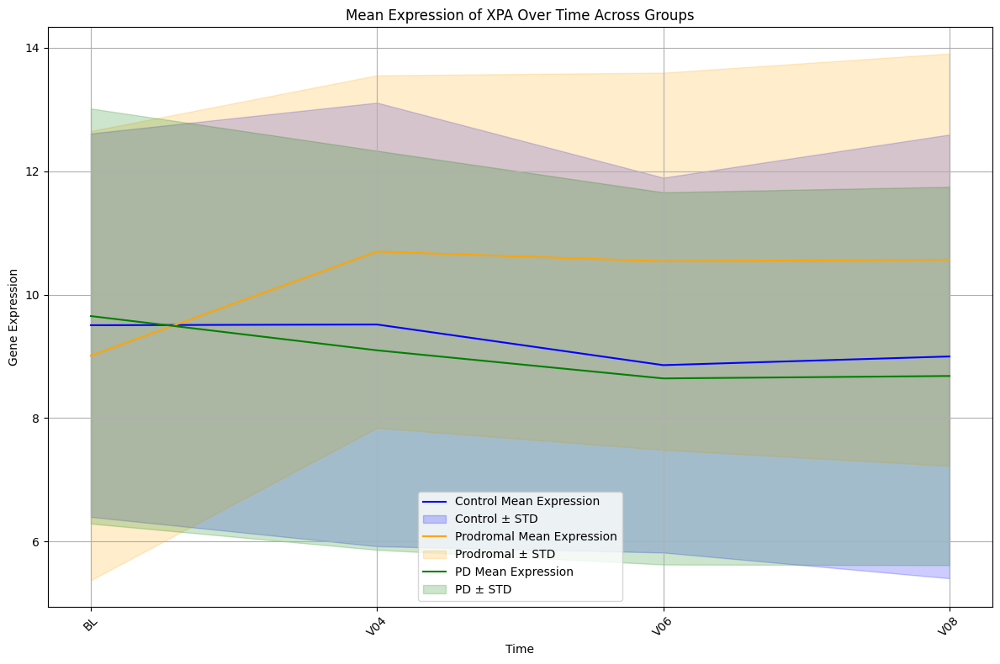

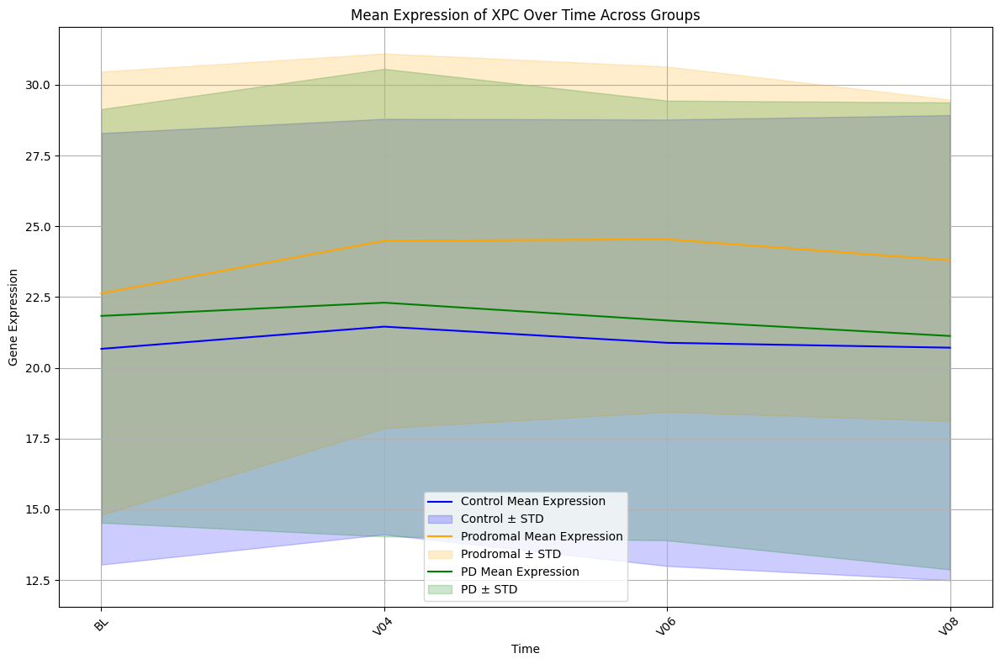

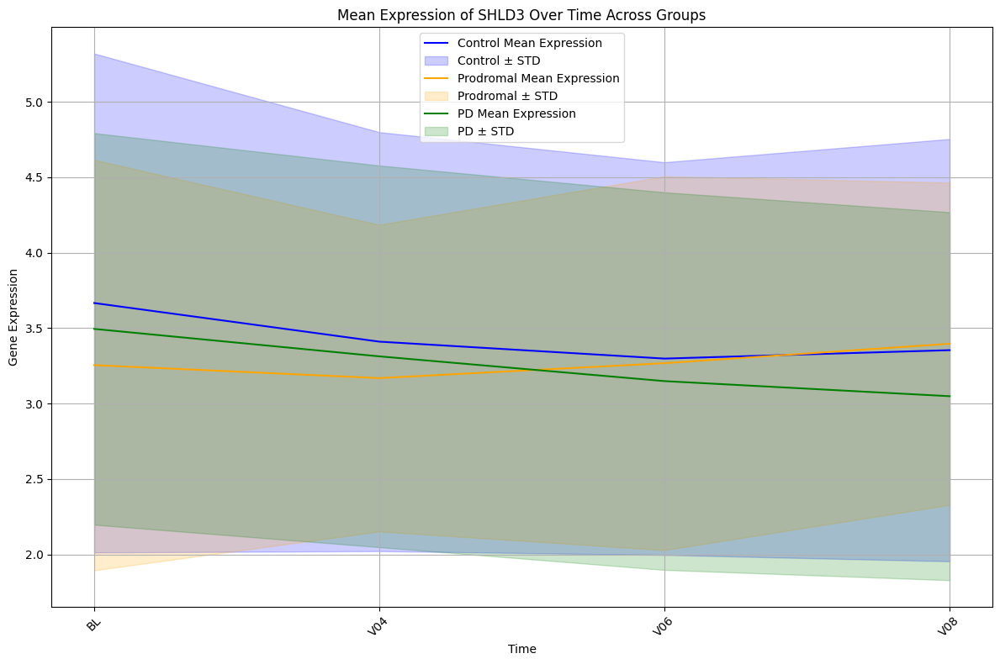

In [86]:
import matplotlib.pyplot as plt

# Loop through each gene
for gene in genes:
    # Create a new figure for each gene
    plt.figure(figsize=(12, 8))
    
    # Define a list to store the group data
    groups = ['Control', 'Prodromal', 'PD']
    colors = {'Control': 'blue', 'Prodromal': 'orange', 'PD': 'green'}
    
    for group in groups:
        # Filter and sort data by group
        group_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith(group)]
        group_tmp_data = group_tmp_data.sort_values(by='New_Time_Point')
        
        # Calculate mean and standard deviation
        mean_expression = group_tmp_data.groupby('New_Time_Point')[gene].mean()
        std_expression = group_tmp_data.groupby('New_Time_Point')[gene].std()
        
        # Extract clean time points
        index = [i.split('_')[1] for i in mean_expression.index]
        
        # Plot mean expression
        plt.plot(index, mean_expression, color=colors[group], label=f'{group} Mean Expression')
        
        # Fill the standard deviation area
        plt.fill_between(index,
                         mean_expression - std_expression,
                         mean_expression + std_expression,
                         color=colors[group], alpha=0.2, label=f'{group} ± STD')
    
    # Customize plot
    plt.xlabel('Time')
    plt.ylabel('Gene Expression')
    gene  = return_gene_name(gene)
    plt.title(f'Mean Expression of {gene} Over Time Across Groups')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()



In [87]:
FEATURE_IMPORTANCES.keys()

dict_keys(['Prodromal_V06_PD_V06_0', 'Prodromal_V06_PD_V06_1', 'Prodromal_V06_PD_V06_2', 'Prodromal_V06_PD_V06_3', 'Prodromal_V06_PD_V06_4', 'Prodromal_V06_PD_V06_5', 'Prodromal_V06_PD_V06_6', 'Prodromal_V06_PD_V06_7', 'Prodromal_V06_PD_V06_8', 'Prodromal_V06_PD_V06_9', 'Prodromal_V06_PD_V06_10', 'Prodromal_V06_PD_V06_11', 'Prodromal_V06_PD_V06_12', 'Prodromal_V06_PD_V06_13', 'Prodromal_V06_PD_V06_14', 'Prodromal_V06_PD_V06_15', 'Prodromal_V06_PD_V06_16', 'Prodromal_V06_PD_V06_17', 'Prodromal_V06_PD_V06_18', 'Prodromal_V06_PD_V06_19', 'Prodromal_V06_PD_V06_20', 'Prodromal_V06_PD_V06_21', 'Prodromal_V06_PD_V06_22', 'Prodromal_V06_PD_V06_23', 'Prodromal_V06_PD_V06_24', 'Prodromal_V06_PD_V06_25', 'Prodromal_V06_PD_V06_26', 'Prodromal_V06_PD_V06_27', 'Prodromal_V06_PD_V06_28', 'Prodromal_V06_PD_V06_29', 'Prodromal_V06_PD_V06_30', 'Prodromal_V06_PD_V06_31', 'Prodromal_V06_PD_V06_32', 'Prodromal_V06_PD_V06_33', 'Prodromal_V06_PD_V06_34', 'Prodromal_V06_PD_V06_35', 'Prodromal_V06_PD_V06_36', 

In [88]:
compare_list = [ 'Prodromal_BL_PD_BL',  'Prodromal_V02_PD_V02' ,'Prodromal_V04_PD_V04','Prodromal_V06_PD_V06', 'Prodromal_V08_PD_V08']

In [89]:
compare_list

['Prodromal_BL_PD_BL',
 'Prodromal_V02_PD_V02',
 'Prodromal_V04_PD_V04',
 'Prodromal_V06_PD_V06',
 'Prodromal_V08_PD_V08']

In [92]:
FEATURE_IMPORTANCES_Prodromal_BL_PD_BL = dict()
FEATURE_IMPORTANCES_Prodromal_V02_PD_V02 = dict()
FEATURE_IMPORTANCES_Prodromal_V04_PD_V04 = dict()
FEATURE_IMPORTANCES_Prodromal_V06_PD_V06 = dict()
FEATURE_IMPORTANCES_Prodromal_V08_PD_V08 = dict()

for i in FEATURE_IMPORTANCES.keys():
    if 'Prodromal_BL_PD_BL' in i:
        FEATURE_IMPORTANCES_Prodromal_BL_PD_BL[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V02_PD_V02' in i:
        FEATURE_IMPORTANCES_Prodromal_V02_PD_V02[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V04_PD_V04' in i:
        FEATURE_IMPORTANCES_Prodromal_V04_PD_V04[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V06_PD_V06' in i:
        FEATURE_IMPORTANCES_Prodromal_V06_PD_V06[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V08_PD_V08' in i:
        FEATURE_IMPORTANCES_Prodromal_V08_PD_V08[i] = FEATURE_IMPORTANCES[i]
        
        

In [93]:
list(FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys())[:10]

['Prodromal_BL_PD_BL_0',
 'Prodromal_BL_PD_BL_1',
 'Prodromal_BL_PD_BL_2',
 'Prodromal_BL_PD_BL_3',
 'Prodromal_BL_PD_BL_4',
 'Prodromal_BL_PD_BL_5',
 'Prodromal_BL_PD_BL_6',
 'Prodromal_BL_PD_BL_7',
 'Prodromal_BL_PD_BL_8',
 'Prodromal_BL_PD_BL_9']

In [94]:
genes_list = list(FEATURE_IMPORTANCES_Prodromal_BL_PD_BL['Prodromal_BL_PD_BL_0'].keys())
genes_list[0:10]

['ENSG00000105486',
 'ENSG00000101868',
 'ENSG00000188827',
 'ENSG00000148229',
 'ENSG00000175482',
 'ENSG00000009413',
 'ENSG00000155229',
 'ENSG00000129484',
 'ENSG00000111358',
 'ENSG00000110768']

In [95]:
len(FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys())

1000

In [96]:
AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys():
        s += FEATURE_IMPORTANCES_Prodromal_BL_PD_BL[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V02_PD_V02 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V02_PD_V02.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V02_PD_V02[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V02_PD_V02.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V02_PD_V02[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V04_PD_V04 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V04_PD_V04.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V04_PD_V04[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V04_PD_V04.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V04_PD_V04[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V06_PD_V06 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V06_PD_V06.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V06_PD_V06[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V06_PD_V06.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V06_PD_V06[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V08_PD_V08 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V08_PD_V08.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V08_PD_V08[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V08_PD_V08.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V08_PD_V08[i] = s
      

In [97]:
AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL

{'ENSG00000105486': 0.21345531504647441,
 'ENSG00000101868': 0.35901984512218643,
 'ENSG00000188827': -0.033005297573202245,
 'ENSG00000148229': -0.3670645709840832,
 'ENSG00000175482': 0.07210921501278784,
 'ENSG00000009413': -0.025061469971250624,
 'ENSG00000155229': -0.0517037767406968,
 'ENSG00000129484': -0.14151731596531344,
 'ENSG00000111358': -0.252638474886869,
 'ENSG00000110768': 0.3129146252547855,
 'ENSG00000166169': -0.05047883918689507,
 'ENSG00000253251': 0.2917472799851219,
 'ENSG00000140398': -0.05304305031033747,
 'ENSG00000163840': 0.43375686099120736,
 'ENSG00000042088': 0.0454195822654297,
 'ENSG00000169188': 0.2504168330782274,
 'ENSG00000065057': 0.34917860923116506,
 'ENSG00000213780': -0.26313813017262877,
 'ENSG00000129071': -0.12716940442403502,
 'ENSG00000134899': -0.014722759433044819,
 'ENSG00000103152': 0.2770612126155695,
 'ENSG00000168496': 0.31465581360813,
 'ENSG00000167986': -0.17510164452860477,
 'ENSG00000119318': -0.18919701629568167,
 'ENSG000001

In [98]:
FEATURE_IMPORTANCES_MERGE = dict()

In [99]:
FEATURE_IMPORTANCES_MERGE['Prodromal_BL_PD_BL'] = AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL
FEATURE_IMPORTANCES_MERGE['Prodromal_V02_PD_V02'] = AVG_FEATURE_IMPORTANCES_Prodromal_V02_PD_V02
FEATURE_IMPORTANCES_MERGE['Prodromal_V04_PD_V04'] = AVG_FEATURE_IMPORTANCES_Prodromal_V04_PD_V04
FEATURE_IMPORTANCES_MERGE['Prodromal_V06_PD_V06'] = AVG_FEATURE_IMPORTANCES_Prodromal_V06_PD_V06
FEATURE_IMPORTANCES_MERGE['Prodromal_V08_PD_V08'] = AVG_FEATURE_IMPORTANCES_Prodromal_V08_PD_V08


In [100]:
ranking_of_features = []
for i in compare_list:


    df = pd.DataFrame(FEATURE_IMPORTANCES_MERGE[i].items())
    df[2] = np.abs(df[1])
    df = df.sort_values(by = 2, ascending=False)
    print(df)
    ranking_of_features.append(df[0].tolist())


                  0         1         2
58  ENSG00000188486 -0.827048  0.827048
76  ENSG00000164306  0.733285  0.733285
40  ENSG00000163945  0.621480  0.621480
59  ENSG00000225830  0.616716  0.616716
84  ENSG00000100479 -0.614105  0.614105
..              ...       ...       ...
35  ENSG00000079246  0.020136  0.020136
51  ENSG00000147400 -0.017549  0.017549
19  ENSG00000134899 -0.014723  0.014723
94  ENSG00000101751 -0.003936  0.003936
61  ENSG00000139372 -0.003122  0.003122

[96 rows x 3 columns]
                  0         1         2
88  ENSG00000177084 -0.753713  0.753713
79  ENSG00000154328  0.560740  0.560740
5   ENSG00000009413 -0.509012  0.509012
14  ENSG00000042088  0.494652  0.494652
83  ENSG00000005156 -0.485363  0.485363
..              ...       ...       ...
84  ENSG00000100479  0.011052  0.011052
85  ENSG00000198924 -0.008549  0.008549
64  ENSG00000132781 -0.004412  0.004412
21  ENSG00000168496 -0.003809  0.003809
31  ENSG00000253729  0.001822  0.001822

[96 rows x 3 col

In [101]:
ranking_of_features[4][0:10]

['ENSG00000123415',
 'ENSG00000175482',
 'ENSG00000166169',
 'ENSG00000070501',
 'ENSG00000148229',
 'ENSG00000122678',
 'ENSG00000100387',
 'ENSG00000164306',
 'ENSG00000119318',
 'ENSG00000129071']

In [102]:
gene_lists = ranking_of_features

In [103]:
gene_lists

[['ENSG00000188486',
  'ENSG00000164306',
  'ENSG00000163945',
  'ENSG00000225830',
  'ENSG00000100479',
  'ENSG00000174405',
  'ENSG00000115350',
  'ENSG00000154328',
  'ENSG00000172613',
  'ENSG00000163161',
  'ENSG00000039650',
  'ENSG00000152457',
  'ENSG00000163840',
  'ENSG00000076924',
  'ENSG00000148229',
  'ENSG00000101868',
  'ENSG00000073050',
  'ENSG00000130997',
  'ENSG00000132781',
  'ENSG00000065057',
  'ENSG00000177084',
  'ENSG00000067369',
  'ENSG00000077514',
  'ENSG00000168496',
  'ENSG00000110768',
  'ENSG00000049167',
  'ENSG00000171984',
  'ENSG00000253251',
  'ENSG00000112130',
  'ENSG00000122008',
  'ENSG00000103152',
  'ENSG00000113522',
  'ENSG00000213780',
  'ENSG00000041880',
  'ENSG00000111358',
  'ENSG00000169188',
  'ENSG00000114026',
  'ENSG00000197299',
  'ENSG00000134574',
  'ENSG00000162585',
  'ENSG00000143799',
  'ENSG00000179262',
  'ENSG00000104884',
  'ENSG00000105486',
  'ENSG00000080345',
  'ENSG00000135945',
  'ENSG00000163918',
  'ENSG000000

In [104]:
gene_indices = {}

# Loop through each list and index each gene
for list_idx, gene_list in enumerate(gene_lists):
    for gene_idx, gene in enumerate(gene_list):
        # Initialize the gene's entry if not present
        if gene not in gene_indices:
            gene_indices[gene] = [-1] * len(gene_lists)  # Default -1 for lists where gene is absent
        # Update the index of the gene in the current list
        gene_indices[gene][list_idx] = gene_idx

# Display results
for gene, indices in gene_indices.items():
    print(f"{gene}: {indices}")

ENSG00000188486: [0, 86, 3, 18, 72]
ENSG00000164306: [1, 64, 78, 39, 7]
ENSG00000163945: [2, 38, 44, 40, 59]
ENSG00000225830: [3, 85, 18, 8, 10]
ENSG00000100479: [4, 91, 38, 50, 50]
ENSG00000174405: [5, 44, 92, 76, 54]
ENSG00000115350: [6, 29, 69, 66, 11]
ENSG00000154328: [7, 1, 9, 45, 22]
ENSG00000172613: [8, 32, 28, 55, 57]
ENSG00000163161: [9, 30, 76, 37, 44]
ENSG00000039650: [10, 66, 57, 59, 14]
ENSG00000152457: [11, 68, 48, 41, 12]
ENSG00000163840: [12, 26, 90, 6, 39]
ENSG00000076924: [13, 65, 75, 51, 42]
ENSG00000148229: [14, 47, 1, 0, 4]
ENSG00000101868: [15, 45, 16, 12, 66]
ENSG00000073050: [16, 16, 50, 57, 52]
ENSG00000130997: [17, 62, 33, 92, 69]
ENSG00000132781: [18, 93, 80, 24, 51]
ENSG00000065057: [19, 48, 8, 42, 63]
ENSG00000177084: [20, 0, 23, 34, 21]
ENSG00000067369: [21, 40, 85, 74, 85]
ENSG00000077514: [22, 67, 32, 94, 40]
ENSG00000168496: [23, 94, 53, 47, 91]
ENSG00000110768: [24, 63, 20, 90, 93]
ENSG00000049167: [25, 71, 46, 30, 45]
ENSG00000171984: [26, 59, 52, 5, 

In [105]:
ranking_df = pd.DataFrame(gene_indices).T
ranking_df.columns = ['BL','V02','V04','V06','V08']
ranking_df

,BL,V02,V04,V06,V08
ENSG00000188486,0,86,3,18,72
ENSG00000164306,1,64,78,39,7
ENSG00000163945,2,38,44,40,59
ENSG00000225830,3,85,18,8,10
ENSG00000100479,4,91,38,50,50
...,...,...,...,...,...
ENSG00000079246,91,53,45,86,31
ENSG00000147400,92,90,17,62,73
ENSG00000134899,93,6,67,27,37
ENSG00000101751,94,74,79,75,94


In [106]:
ranking_df.to_csv('ranking_df/smaller_prodromal_to_PD_ranking_df.csv', index=True)

In [107]:
subset_dict = {key: gene_indices[key] for key in ranking_of_features[4] if key in gene_indices}

print(subset_dict)

{'ENSG00000123415': [51, 46, 42, 48, 0], 'ENSG00000175482': [76, 7, 0, 9, 1], 'ENSG00000166169': [83, 23, 61, 95, 2], 'ENSG00000070501': [59, 56, 37, 38, 3], 'ENSG00000148229': [14, 47, 1, 0, 4], 'ENSG00000122678': [70, 70, 49, 69, 5], 'ENSG00000100387': [60, 18, 55, 56, 6], 'ENSG00000164306': [1, 64, 78, 39, 7], 'ENSG00000119318': [52, 13, 39, 7, 8], 'ENSG00000129071': [66, 37, 54, 4, 9], 'ENSG00000225830': [3, 85, 18, 8, 10], 'ENSG00000115350': [6, 29, 69, 66, 11], 'ENSG00000152457': [11, 68, 48, 41, 12], 'ENSG00000253729': [58, 95, 25, 19, 13], 'ENSG00000039650': [10, 66, 57, 59, 14], 'ENSG00000009413': [89, 2, 94, 11, 15], 'ENSG00000139372': [95, 57, 86, 22, 16], 'ENSG00000109674': [56, 79, 24, 23, 17], 'ENSG00000012061': [47, 21, 60, 44, 18], 'ENSG00000113456': [72, 9, 77, 35, 19], 'ENSG00000080345': [44, 50, 11, 14, 20], 'ENSG00000177084': [20, 0, 23, 34, 21], 'ENSG00000154328': [7, 1, 9, 45, 22], 'ENSG00000062822': [53, 14, 12, 20, 23], 'ENSG00000113522': [31, 25, 35, 16, 24], '

In [108]:
subset_dict

{'ENSG00000123415': [51, 46, 42, 48, 0],
 'ENSG00000175482': [76, 7, 0, 9, 1],
 'ENSG00000166169': [83, 23, 61, 95, 2],
 'ENSG00000070501': [59, 56, 37, 38, 3],
 'ENSG00000148229': [14, 47, 1, 0, 4],
 'ENSG00000122678': [70, 70, 49, 69, 5],
 'ENSG00000100387': [60, 18, 55, 56, 6],
 'ENSG00000164306': [1, 64, 78, 39, 7],
 'ENSG00000119318': [52, 13, 39, 7, 8],
 'ENSG00000129071': [66, 37, 54, 4, 9],
 'ENSG00000225830': [3, 85, 18, 8, 10],
 'ENSG00000115350': [6, 29, 69, 66, 11],
 'ENSG00000152457': [11, 68, 48, 41, 12],
 'ENSG00000253729': [58, 95, 25, 19, 13],
 'ENSG00000039650': [10, 66, 57, 59, 14],
 'ENSG00000009413': [89, 2, 94, 11, 15],
 'ENSG00000139372': [95, 57, 86, 22, 16],
 'ENSG00000109674': [56, 79, 24, 23, 17],
 'ENSG00000012061': [47, 21, 60, 44, 18],
 'ENSG00000113456': [72, 9, 77, 35, 19],
 'ENSG00000080345': [44, 50, 11, 14, 20],
 'ENSG00000177084': [20, 0, 23, 34, 21],
 'ENSG00000154328': [7, 1, 9, 45, 22],
 'ENSG00000062822': [53, 14, 12, 20, 23],
 'ENSG00000113522':

In [109]:
gene_ranks = subset_dict


In [110]:
# Original dictionary with gene rankings
'''gene_ranks = subset_dict


# Flatten the list to find the min and max values across all rankings
all_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]
min_rank, max_rank = min(all_ranks), max(all_ranks)

# Normalize each ranking
normalized_gene_ranks = {
    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]
    for gene, ranks in gene_ranks.items()
}

# Display the normalized rankings
for gene, normalized_ranks in normalized_gene_ranks.items():
    print(f"{gene}: {normalized_ranks}")'''


'gene_ranks = subset_dict\n\n\n# Flatten the list to find the min and max values across all rankings\nall_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]\nmin_rank, max_rank = min(all_ranks), max(all_ranks)\n\n# Normalize each ranking\nnormalized_gene_ranks = {\n    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]\n    for gene, ranks in gene_ranks.items()\n}\n\n# Display the normalized rankings\nfor gene, normalized_ranks in normalized_gene_ranks.items():\n    print(f"{gene}: {normalized_ranks}")'

In [111]:
df = pd.DataFrame(gene_ranks).T
df

,0,1,2,3,4
ENSG00000123415,51,46,42,48,0
ENSG00000175482,76,7,0,9,1
ENSG00000166169,83,23,61,95,2
ENSG00000070501,59,56,37,38,3
ENSG00000148229,14,47,1,0,4
...,...,...,...,...,...
ENSG00000168496,23,94,53,47,91
ENSG00000179262,41,80,64,15,92
ENSG00000110768,24,63,20,90,93
ENSG00000101751,94,74,79,75,94


In [112]:
df

,0,1,2,3,4
ENSG00000123415,51,46,42,48,0
ENSG00000175482,76,7,0,9,1
ENSG00000166169,83,23,61,95,2
ENSG00000070501,59,56,37,38,3
ENSG00000148229,14,47,1,0,4
...,...,...,...,...,...
ENSG00000168496,23,94,53,47,91
ENSG00000179262,41,80,64,15,92
ENSG00000110768,24,63,20,90,93
ENSG00000101751,94,74,79,75,94


In [113]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

tmp_df = df.reset_index()
df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()
df.loc['ENSG00000163840','Gene_Name'] = 'DTX3L'
df.set_index('Gene_Name',inplace=True)

In [114]:
ranked_df = df.rank(axis=0, method='min').astype(int)

print(ranked_df)

            0   1   2   3   4
Gene_Name                    
SMUG1      52  47  43  49   1
POLD4      77   8   1  10   2
POLL       84  24  62  96   3
POLB       60  57  38  39   4
POLE3      15  48   2   1   5
...        ..  ..  ..  ..  ..
FEN1       24  95  54  48  92
RAD23A     42  81  65  16  93
GTF2H1     25  64  21  91  94
POLI       95  75  80  76  95
OGG1       37   9  67  85  96

[96 rows x 5 columns]


In [115]:
reversed_ranks = ranked_df .max() - ranked_df  + 1

print(reversed_ranks)

            0   1   2   3   4
Gene_Name                    
SMUG1      45  50  54  48  96
POLD4      20  89  96  87  95
POLL       13  73  35   1  94
POLB       37  40  59  58  93
POLE3      82  49  95  96  92
...        ..  ..  ..  ..  ..
FEN1       73   2  43  49   5
RAD23A     55  16  32  81   4
GTF2H1     72  33  76   6   3
POLI        2  22  17  21   2
OGG1       60  88  30  12   1

[96 rows x 5 columns]


In [116]:
rank_dict = reversed_ranks.T.to_dict(orient='list')
rank_dict

{'SMUG1': [45, 50, 54, 48, 96],
 'POLD4': [20, 89, 96, 87, 95],
 'POLL': [13, 73, 35, 1, 94],
 'POLB': [37, 40, 59, 58, 93],
 'POLE3': [82, 49, 95, 96, 92],
 'POLM': [26, 26, 47, 27, 91],
 'RBX1': [36, 78, 41, 40, 90],
 'PRIMPOL': [95, 32, 18, 57, 89],
 'RAD23B': [44, 83, 57, 89, 88],
 'MBD4': [30, 59, 42, 92, 87],
 'ERCC6': [93, 11, 78, 88, 86],
 'POLE4': [90, 67, 27, 30, 85],
 'DCLRE1C': [85, 28, 48, 55, 84],
 'PRKDC': [38, 1, 71, 77, 83],
 'PNKP': [86, 30, 39, 37, 82],
 'REV3L': [7, 94, 2, 85, 81],
 'TDG': [1, 39, 10, 74, 80],
 'NEIL3': [40, 17, 72, 73, 79],
 'ERCC1': [49, 75, 36, 52, 78],
 'RAD1': [24, 87, 19, 61, 77],
 'RIF1': [52, 46, 85, 82, 76],
 'POLE': [76, 96, 73, 62, 75],
 'NEIL2': [89, 95, 87, 51, 74],
 'POLD1': [43, 82, 84, 76, 73],
 'RAD50': [65, 71, 61, 80, 72],
 'NEIL1': [15, 69, 34, 29, 71],
 'GTF2H2': [32, 23, 9, 43, 70],
 'BLM': [59, 15, 28, 23, 69],
 'MRE11': [35, 54, 31, 79, 68],
 'NHEJ1': [23, 13, 74, 64, 67],
 'APLF': [31, 77, 56, 9, 66],
 'XRCC5': [5, 43, 51, 1

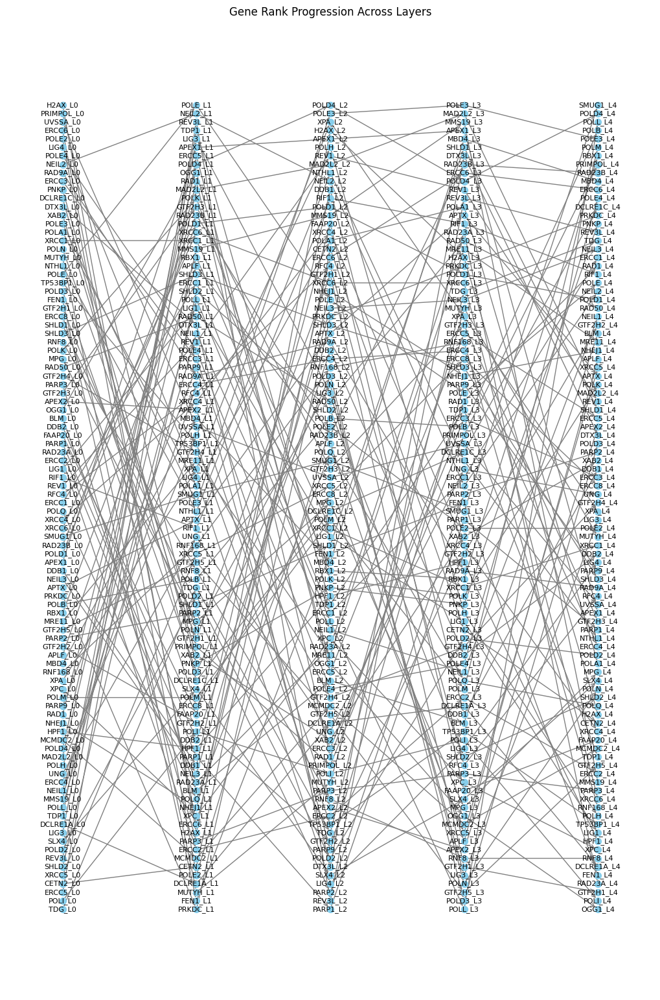

In [117]:
import matplotlib.pyplot as plt
import networkx as nx

# The rank positions for each gene across four layers
gene_ranks = rank_dict

G = nx.DiGraph()

# Number of layers
num_layers = len(next(iter(gene_ranks.values())))

# Add nodes and edges for each gene across the layers
for gene, ranks in gene_ranks.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

plt.title("Gene Rank Progression Across Layers")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.show()

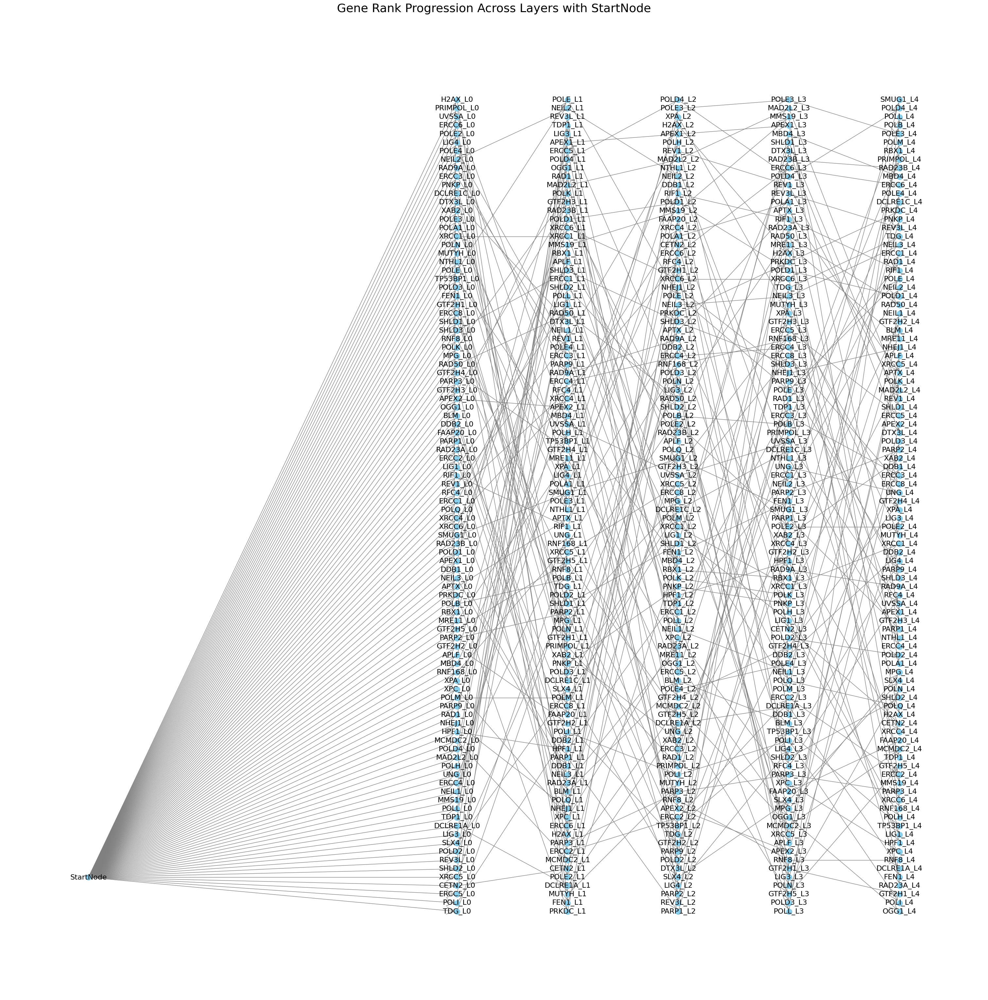

In [118]:
import matplotlib.pyplot as plt
import networkx as nx


# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

# Set the position of the StartNode to be at the mid-left of the first layer
start_node_x_pos = -5 # Fixed position on the left
start_node_y_pos = -1.5  # Middle of first layer vertically

# Position the nodes
for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    
    if layer == -1:
        # Place the StartNode on the mid-left of the first layer
        pos[node] = (start_node_x_pos, start_node_y_pos)
    else:
        # Place other nodes based on their layer and rank
        pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(30, 30))
nx.draw(G, pos, with_labels=True, node_size=150, font_size=16, arrowstyle='->', arrowsize=40, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode", fontsize=26)
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower

# Save the plot as an SVG file
plt.savefig("gene_rank_progression_with_start_node_left.svg", format="svg")
plt.savefig("gene_rank_progression_with_start_node_left.png", format="png")
plt.savefig("smaller_plots/smaller_gene_ranked_prgression_prodromal_to_pd.png", dpi=100)

# Show the plot
plt.show()


In [119]:
results

,Gene name,Gene stable ID
2232,GTF2H1,ENSG00000288114
2238,SHLD1,ENSG00000171984
2974,ERCC5,ENSG00000134899
3129,LIG4,ENSG00000174405
4837,APTX,ENSG00000137074
...,...,...
76354,POLE4,ENSG00000115350
81706,XPC,ENSG00000154767
82903,FAAP20,ENSG00000162585
83467,MUTYH,ENSG00000132781


In [120]:
!mkdir -p feature_importance_weights/smaller_set_genes/prodromal_vs_pd
def return_value(i):

    l = [AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL[i],AVG_FEATURE_IMPORTANCES_Prodromal_V02_PD_V02[i],AVG_FEATURE_IMPORTANCES_Prodromal_V04_PD_V04[i],
    AVG_FEATURE_IMPORTANCES_Prodromal_V06_PD_V06[i],AVG_FEATURE_IMPORTANCES_Prodromal_V08_PD_V08[i]]
    return l


li = []
genes = []
for i in AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys():
    
    li.append(return_value(i))
    genes.append(i)

df = pd.DataFrame(li)
df['genes'] = genes
df = df.set_index('genes')
df.columns = ['BL','V02','V04','V06','V08']
df['Gene_Name'] =df.reset_index()['genes'].apply(return_gene_name).tolist()
df = df.set_index('Gene_Name')
df.to_csv(f'feature_importance_weights/smaller_set_genes/prodromal_vs_pd/prodromal_vs_pd.csv',index = True)
df


,BL,V02,V04,V06,V08
Gene_Name,,,,,
LIG1,0.213455,0.250861,0.103024,0.092019,-0.014496
POLA1,0.359020,-0.157108,0.296876,0.297291,0.030883
SLX4,-0.033005,-0.064751,-0.016604,-0.028978,-0.028295
POLE3,-0.367065,-0.150981,-0.606969,-0.707791,-0.252586
POLD4,0.072109,0.427349,0.783852,0.320629,0.290657
...,...,...,...,...,...
LIG4,0.611054,0.162735,0.013729,0.048357,-0.039556
POLM,0.110406,0.063680,-0.107411,-0.072413,0.251767
HPF1,0.088298,-0.038407,0.076780,-0.104984,0.014258
